In [37]:
import numpy as np
import matplotlib.pyplot as plt
import tensortools as tt
import h5py

from sklearn.decomposition import PCA
from scipy.stats import mannwhitneyu
import seaborn as sns
from sklearn.manifold import SpectralEmbedding
import umap
import matplotlib.cm as cm
import plotly.express as px
import pandas as pd
import plotly.graph_objects as go
import sys
from mpl_toolkits.mplot3d import Axes3D

# PCA & UMAP (reduce neurons dim)

## Means

In [38]:
data_folder = 'data_yue'
exps_dLGN_36_sample = [
    'CC182_240905_ThresholdedNaN3_Combined'
] 
exps_dLGN_36 = [
    'CC182_240905_ThresholdedNaN3_Combined', 
    'CC182_240906_ThresholdedNaN3_Combined', 
    'CC182_240911_ThresholdedNaN3_Combined', 
    'CC182_240912_ThresholdedNaN3_Combined', 
    'CC182_240913_ThresholdedNaN3_Combined', 
    'CC185_240916_ThresholdedNaN3_Combined', 
    'CC185_240917_ThresholdedNaN3_Combined', 
    'CC185_240919_ThresholdedNaN3_Combined' 
]
exps_dLGN_48 = [
    'CC185_241025_ThresholdedNaN3_Combined', 
    'CC185_241026_ThresholdedNaN3_Combined',
    'CC182_241028_ThresholdedNaN3_Combined'
] 
exps_SC_48 = [
    'Mouse368_241107_ThresholdedNaN3_Combined', 
    'Mouse368_241108_ThresholdedNaN3_Combined', 
    'Mouse370_241109_ThresholdedNaN3_Combined'
]

experiments = exps_dLGN_48

# Average Files (dFFdotMeanValues):
# 4 (sessions) x 36 (stim conditions) cells
# within each cell, we find a matrix:
# 10 repeats x 73 neurons
# where each value is the mean dF/F for each trial (presentation)

# Traces files (dFFdotTraces):
# 4 (sessions) x 36 (stim conditions) cells
# within each cell, we find a tensor:
# # frames x # neurons x # repeats (including 2 sec before and after stimulus)
# i.e., 85 (frames-[2s off 1.5s on 2s off]) x *** (cell number) x 10 (repeats)

In [39]:
# N_REPS = 10  # Number of repetitions (repeats)
# N_NEURONS = 73  # Number of neurons
# N_SESSIONS = 4  # Number of sessions (runs)
# N_STIMS = 36  # Number of stimuli

# Get N_REPS/N_NEURONS/N_SESSIONS/N_STIMS from data

for exp in experiments:
    print(f"--- {exp} ---")
    prefix = '_'.join(exp.split('_')[:2]) + '_'
    mat_file_path = f'{data_folder}/{exp}/{prefix}Combined_dFFdotMeanValues.mat'
    with h5py.File(mat_file_path, 'r') as f:
        # Access the 'dFFdotMeanValues' dataset (which has shape 36x4)
        data = f['dFFdotMeanValues']
        # Check the shape of the dataset, should be (36, 4)
        N_STIMS, N_SESSIONS = data.shape
        print(f"Data outer-level shape: {data.shape}")  # Debugging statement: Expected shape (36, 4)
        N_NEURONS, N_REPS = f[data[0, 0]].shape
        print(f"Data inner-level shape: {f[data[0, 0]].shape}")

--- CC185_241025_ThresholdedNaN3_Combined ---
Data outer-level shape: (48, 4)
Data inner-level shape: (84, 10)
--- CC185_241026_ThresholdedNaN3_Combined ---
Data outer-level shape: (48, 4)
Data inner-level shape: (93, 10)
--- CC182_241028_ThresholdedNaN3_Combined ---
Data outer-level shape: (48, 4)
Data inner-level shape: (48, 10)


In [40]:
X_list = []

# sessions 3 and 4 have different stimuli order compared to sessions 1 and 2
# # use reorder_indices to reorder sessions 3 and 4 to have same order
reorder_indices = [19, 0, 17, 30, 26, 2, 13, 29, 34, 47, 25, 1, 44, 42, 32, 24, 5, 
                   33, 9, 28, 38, 4, 45, 14, 46, 31, 35, 12, 43, 16, 36, 15, 21, 39, 
                   8, 41, 18, 27, 11, 10, 6, 20, 40, 37, 22, 7, 23, 3]

for exp in experiments:
    print(f"--- {exp} ---")
    prefix = '_'.join(exp.split('_')[:2]) + '_'
    mat_file_path = f'{data_folder}/{exp}/{prefix}Combined_dFFdotMeanValues.mat'
    with h5py.File(mat_file_path, 'r') as f:
        # Access the 'dFFdotMeanValues' dataset (which has shape 36x4)
        data = f['dFFdotMeanValues']

        N_STIMS, N_SESSIONS = data.shape
        N_NEURONS, N_REPS = f[data[0, 0]].shape
        assert N_SESSIONS == 4
        # N_SESSIONS = 2

        X_ = np.zeros((N_SESSIONS*N_STIMS*N_REPS, N_NEURONS))

        for stim_i in range(N_STIMS):

            for session_i in range(N_SESSIONS):

                if session_i > 1:
                    stim_i_ = reorder_indices.index(stim_i)
                else:
                    stim_i_ = stim_i

                start = stim_i_*N_SESSIONS*N_REPS + session_i*N_REPS
                end = stim_i_*N_SESSIONS*N_REPS + (session_i+1)*N_REPS

                repetitions = f[data[stim_i, session_i]][:]
                repetitions = repetitions[:]
                repetitions = repetitions.T # Transpose to get the shape (10, 73)

                X_[start:end, :] = repetitions
    X_list.append(X_)

X = np.hstack(X_list)

print(f"X shape: {X.shape}")  # Debugging statement: Expected shape (1440, 73)
stimulus_labels = np.repeat(np.arange(N_STIMS), N_SESSIONS*N_REPS)
print(f"stimulus_labels shape: {stimulus_labels.shape}")  # Debugging statement: Expected shape (1440,)
display(stimulus_labels)
session_labels = np.repeat(np.arange(N_SESSIONS), N_STIMS*N_REPS)
print(f"session_labels shape: {session_labels.shape}")  # Debugging statement: Expected shape (1440,)
display(session_labels)
# 1440 = 4 * 36 *10

--- CC185_241025_ThresholdedNaN3_Combined ---
--- CC185_241026_ThresholdedNaN3_Combined ---


--- CC182_241028_ThresholdedNaN3_Combined ---
X shape: (1920, 225)
stimulus_labels shape: (1920,)


array([ 0,  0,  0, ..., 47, 47, 47])

session_labels shape: (1920,)


array([0, 0, 0, ..., 3, 3, 3])

In [41]:
label_names = [
    "neg_3flows_45", "gratings_lf_90", "gratings_hf_45", "neg_1flows_270",
    "pos_1flows_135", "pos_3flows_180", "pos_1flows_45", "neg_3flows_315",
    "gratings_hf_270", "gratings_lf_0", "pos_3flows_45", "neg_1flows_45",
    "neg_1flows_0", "pos_1flows_0", "pos_3flows_0", "gratings_lf_225",
    "gratings_hf_90", "neg_3flows_180", "gratings_hf_0", "neg_1flows_135",
    "pos_3flows_225", "pos_1flows_315", "neg_3flows_135", "gratings_lf_180",
    "pos_3flows_90", "gratings_lf_135", "pos_1flows_180", "neg_3flows_0",
    "gratings_hf_225", "neg_1flows_180", "gratings_hf_135", "pos_3flows_315",
    "pos_1flows_225", "gratings_lf_270", "neg_1flows_225", "neg_3flows_270",
    "neg_1flows_315", "gratings_hf_180", "pos_3flows_270", "neg_3flows_225",
    "pos_1flows_270", "gratings_lf_45", "pos_1flows_90", "neg_1flows_90",
    "gratings_hf_315", "gratings_lf_315", "pos_3flows_135", "neg_3flows_90"
]

better_label_names = [
    'gratings_lf_0', 'gratings_lf_45', 'gratings_lf_90', 'gratings_lf_135', 
    'gratings_lf_180', 'gratings_lf_225', 'gratings_lf_270', 'gratings_lf_315',
    'gratings_hf_0', 'gratings_hf_45', 'gratings_hf_90', 'gratings_hf_135', 
    'gratings_hf_180', 'gratings_hf_225', 'gratings_hf_270', 'gratings_hf_315',
    'neg_1flows_0', 'neg_1flows_45', 'neg_1flows_90', 'neg_1flows_135', 
    'neg_1flows_180', 'neg_1flows_225', 'neg_1flows_270', 'neg_1flows_315',
    'neg_3flows_0', 'neg_3flows_45', 'neg_3flows_90', 'neg_3flows_135', 
    'neg_3flows_180', 'neg_3flows_225', 'neg_3flows_270', 'neg_3flows_315',
    'pos_1flows_0', 'pos_1flows_45', 'pos_1flows_90', 'pos_1flows_135', 
    'pos_1flows_180', 'pos_1flows_225', 'pos_1flows_270', 'pos_1flows_315',
    'pos_3flows_0', 'pos_3flows_45', 'pos_3flows_90', 'pos_3flows_135', 
    'pos_3flows_180', 'pos_3flows_225', 'pos_3flows_270', 'pos_3flows_315'
]

# Find the indices of reordered_label_names in label_names
BetterLabel_indices = [label_names.index(label) for label in better_label_names]
print(BetterLabel_indices)
print([label_names[i] for i in BetterLabel_indices])


[9, 41, 1, 25, 23, 15, 33, 45, 18, 2, 16, 30, 37, 28, 8, 44, 12, 11, 43, 19, 29, 34, 3, 36, 27, 0, 47, 22, 17, 39, 35, 7, 13, 6, 42, 4, 26, 32, 40, 21, 14, 10, 24, 46, 5, 20, 38, 31]
['gratings_lf_0', 'gratings_lf_45', 'gratings_lf_90', 'gratings_lf_135', 'gratings_lf_180', 'gratings_lf_225', 'gratings_lf_270', 'gratings_lf_315', 'gratings_hf_0', 'gratings_hf_45', 'gratings_hf_90', 'gratings_hf_135', 'gratings_hf_180', 'gratings_hf_225', 'gratings_hf_270', 'gratings_hf_315', 'neg_1flows_0', 'neg_1flows_45', 'neg_1flows_90', 'neg_1flows_135', 'neg_1flows_180', 'neg_1flows_225', 'neg_1flows_270', 'neg_1flows_315', 'neg_3flows_0', 'neg_3flows_45', 'neg_3flows_90', 'neg_3flows_135', 'neg_3flows_180', 'neg_3flows_225', 'neg_3flows_270', 'neg_3flows_315', 'pos_1flows_0', 'pos_1flows_45', 'pos_1flows_90', 'pos_1flows_135', 'pos_1flows_180', 'pos_1flows_225', 'pos_1flows_270', 'pos_1flows_315', 'pos_3flows_0', 'pos_3flows_45', 'pos_3flows_90', 'pos_3flows_135', 'pos_3flows_180', 'pos_3flows_22

### Classification

In [42]:
from sklearn.linear_model import LogisticRegression
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score

# Initialize better_stimulus_labels with the same shape as stimulus_labels
better_stimulus_labels = np.zeros_like(stimulus_labels)

# Use a for loop to replace values based on BetterLabel_indices
for new_label, original_label in enumerate(BetterLabel_indices):
    better_stimulus_labels[stimulus_labels == original_label] = new_label

# Output the result
print(better_stimulus_labels)

# Group data by stimulus
num_stimuli = len(np.unique(better_stimulus_labels))
stimulus_groups = [X[better_stimulus_labels == i] for i in range(num_stimuli)]

[25 25 25 ... 26 26 26]


In [43]:
# Initialize the 48x48 matrix
difference_matrix = np.zeros((num_stimuli, num_stimuli))

# Iterate over all pairs of stimuli
for i in range(num_stimuli):
    for j in range(i + 1, num_stimuli):  # Only compute for upper triangle (symmetry)
        # Combine data from two stimuli
        data_i = stimulus_groups[i]
        data_j = stimulus_groups[j]
        data = np.vstack([data_i, data_j])
        
        # Create labels: 0 for stimulus i, 1 for stimulus j
        labels = np.hstack([np.zeros(data_i.shape[0]), np.ones(data_j.shape[0])])
        
        # Split into training and testing sets
        X_train, X_test, y_train, y_test = train_test_split(data, labels, test_size=0.3, random_state=1116)
        
        # Train a simple classifier (e.g., logistic regression)
        clf = LogisticRegression(random_state=1116)
        clf.fit(X_train, y_train)
        
        # Test the classifier
        y_pred = clf.predict(X_test)
        accuracy = accuracy_score(y_test, y_pred)
        
        # Fill the matrix with classification accuracy
        difference_matrix[i, j] = accuracy
        difference_matrix[j, i] = accuracy  # Symmetric

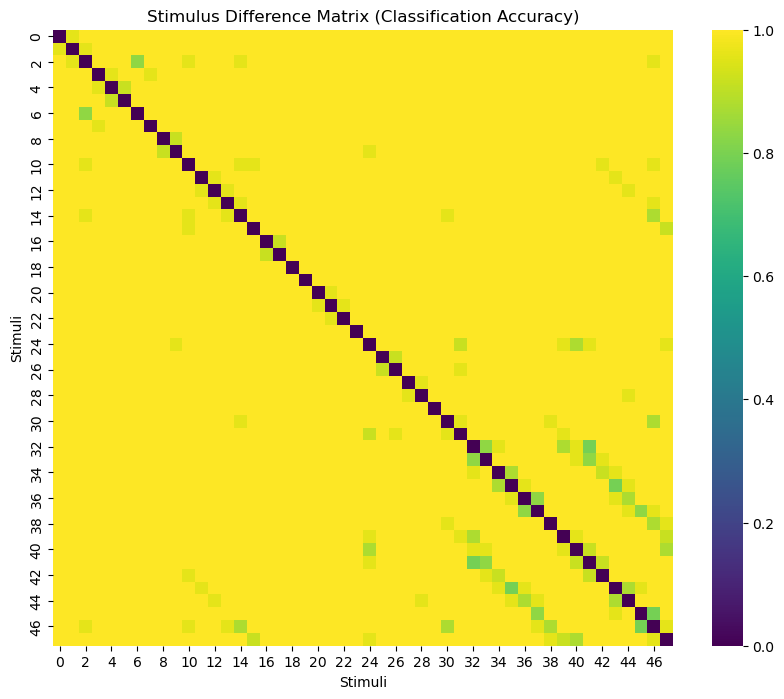

In [44]:
plt.figure(figsize=(10, 8))
sns.heatmap(difference_matrix, cmap='viridis', annot=False)
plt.title("Stimulus Difference Matrix (Classification Accuracy)")
plt.xlabel("Stimuli")
plt.ylabel("Stimuli")
plt.show()

In [45]:
# Extract the upper triangle of the matrix (excluding the diagonal)
n = difference_matrix.shape[0]
upper_triangle_indices = np.triu_indices(n, k=1)  # Indices of the upper triangle (k=1 excludes the diagonal)
scores = difference_matrix[upper_triangle_indices]  # Flattened array of upper triangle values

# Sort the scores and get the indices of the top 10 lowest scores
x= 20
sorted_indices = np.argsort(scores)  # Sorted indices (ascending)
top_x_indices = sorted_indices[:x]  # Indices of the 10 lowest scores

# Retrieve the corresponding stimulus pairs and their scores
top_x_pairs = [(upper_triangle_indices[0][i], upper_triangle_indices[1][i]) for i in top_x_indices]
top_x_scores = scores[top_x_indices]

# Print the names and scores of the top 10 lowest-scoring pairs
print(f"Top {x} Lowest Scoring Pairs:")
for (i, j), score in zip(top_x_pairs, top_x_scores):
    print(f"{better_label_names[i]} (stim {i}) vs {better_label_names[j]} (stim {j}): {score:.4f}")

Top 20 Lowest Scoring Pairs:
pos_3flows_225 (stim 45) vs pos_3flows_270 (stim 46): 0.7917
pos_1flows_0 (stim 32) vs pos_3flows_45 (stim 41): 0.7917
pos_1flows_135 (stim 35) vs pos_3flows_135 (stim 43): 0.7917
gratings_lf_90 (stim 2) vs gratings_lf_270 (stim 6): 0.8333
pos_1flows_45 (stim 33) vs pos_3flows_45 (stim 41): 0.8333
pos_1flows_180 (stim 36) vs pos_1flows_225 (stim 37): 0.8333
pos_1flows_225 (stim 37) vs pos_3flows_225 (stim 45): 0.8333
pos_1flows_0 (stim 32) vs pos_1flows_45 (stim 33): 0.8333
pos_1flows_180 (stim 36) vs pos_3flows_180 (stim 44): 0.8750
pos_1flows_0 (stim 32) vs pos_1flows_315 (stim 39): 0.8750
neg_3flows_270 (stim 30) vs pos_3flows_270 (stim 46): 0.8750
gratings_hf_270 (stim 14) vs pos_3flows_270 (stim 46): 0.8750
pos_3flows_0 (stim 40) vs pos_3flows_315 (stim 47): 0.8750
pos_3flows_135 (stim 43) vs pos_3flows_180 (stim 44): 0.8750
neg_3flows_0 (stim 24) vs pos_3flows_0 (stim 40): 0.8750
pos_1flows_270 (stim 38) vs pos_3flows_270 (stim 46): 0.8750
pos_1flows_

### Do PCA and UMAP

(1920, 20) <class 'numpy.ndarray'>


Text(0, 0.5, 'Explained Variance Ratio')

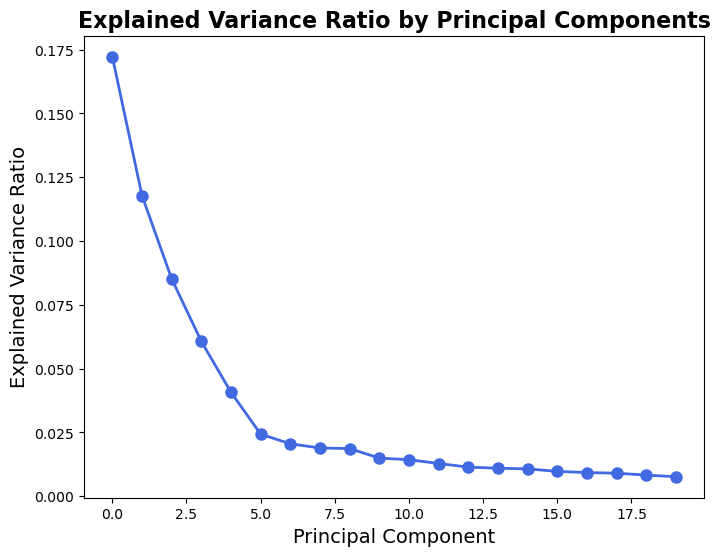

In [46]:
pca = PCA(20, random_state=1116)
Y = pca.fit_transform(X)
print(Y.shape, type(Y))

plt.figure(figsize=(8, 6))
plt.plot(pca.explained_variance_ratio_, color='royalblue', marker='o', linestyle='-', linewidth=2, markersize=8)
plt.title('Explained Variance Ratio by Principal Components', fontsize=16, fontweight='bold')
plt.xlabel('Principal Component', fontsize=14)
plt.ylabel('Explained Variance Ratio', fontsize=14)

In [47]:
# Initialize UMAP with the desired number of components
reducer = umap.UMAP(n_components=3, random_state=1116, n_jobs=1)

Y_umap = reducer.fit_transform(X)
print("Shape of Y_umap:", Y_umap.shape)

Shape of Y_umap: (1920, 3)


### All-label figs

C:\Users\hc879\AppData\Local\Temp\ipykernel_6688\2179239685.py:3: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = cm.get_cmap('tab20', num_stimuli)  # Use a colormap with 36 distinct colors


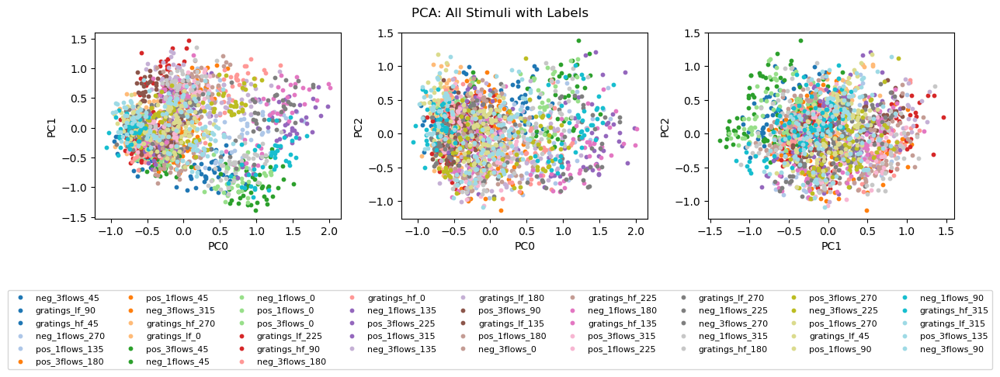

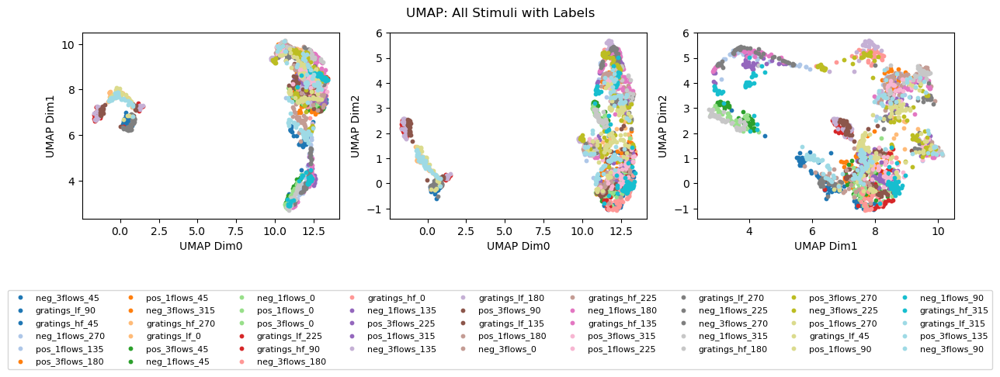

In [48]:
PCs = [(0, 1), (0, 2), (1, 2)]  # Define the PC pairs to plot
num_stimuli = len(label_names)  # This is 36
colors = cm.get_cmap('tab20', num_stimuli)  # Use a colormap with 36 distinct colors

# PCA Plot
f, axes = plt.subplots(1, len(PCs), figsize=(4 * len(PCs), 4))

for ax, pcs in zip(axes, PCs):
    for i in range(num_stimuli):
        # Create mask for each stimulus
        stimulus_mask = (stimulus_labels == i)
        # Plot points for each stimulus, assigning a unique color and label
        ax.scatter(*Y[stimulus_mask][:, pcs].T, c=[colors(i)], label=label_names[i], s=10)
    
    ax.set(xlabel=f'PC{pcs[0]}', ylabel=f'PC{pcs[1]}')

# Create a single legend below the plots
handles, labels = ax.get_legend_handles_labels()

f.suptitle('PCA: All Stimuli with Labels')
f.legend(handles, labels, loc='lower center', bbox_to_anchor=(0.5, -0.2), ncol=9, fontsize=8)  # Legend in 4x9 grid
f.tight_layout()
plt.subplots_adjust(top=0.9, bottom=0.3)  # Adjust space for the legend
plt.show()

# UMAP Plot
f, axes = plt.subplots(1, len(PCs), figsize=(4 * len(PCs), 4))

for ax, pcs in zip(axes, PCs):
    for i in range(num_stimuli):
        # Create mask for each stimulus
        stimulus_mask = (stimulus_labels == i)
        # Plot points for each stimulus, assigning a unique color and label
        ax.scatter(*Y_umap[stimulus_mask][:, pcs].T, c=[colors(i)], label=label_names[i], s=10)
    
    ax.set(xlabel=f'UMAP Dim{pcs[0]}', ylabel=f'UMAP Dim{pcs[1]}')

# Create a single legend below the plots
handles, labels = ax.get_legend_handles_labels()

f.suptitle('UMAP: All Stimuli with Labels')
f.legend(handles, labels, loc='lower center', bbox_to_anchor=(0.5, -0.2), ncol=9, fontsize=8)  # Legend in 4x9 grid
f.tight_layout()
plt.subplots_adjust(top=0.9, bottom=0.3)  # Adjust space for the legend
plt.show()

In [49]:
# Create a DataFrame to hold the PCA and UMAP data along with labels
df_pca = pd.DataFrame(Y[:, :3], columns=[f'PC{i}' for i in range(3)])
df_pca['stimulus'] = stimulus_labels
df_pca['stimulus_name'] = [label_names[i] for i in stimulus_labels]

df_umap = pd.DataFrame(Y_umap[:, :3], columns=[f'UMAP Dim{i}' for i in range(3)])
df_umap['stimulus'] = stimulus_labels
df_umap['stimulus_name'] = [label_names[i] for i in stimulus_labels]

# Plot PCA
fig_pca = px.scatter_matrix(
    df_pca,
    dimensions=['PC0', 'PC1', 'PC2'],
    color='stimulus_name',
    hover_name='stimulus_name',
    title='PCA: All Stimuli with Labels',
    labels={'stimulus_name': 'Stimulus'}
)

# Show stimulus name on hover
fig_pca.update_traces(marker=dict(size=6, opacity=0.8))

# Save the PCA plot as an HTML file
fig_pca.write_html('pca_of_means_interactive.html')
fig_pca.show()

# Plot UMAP
fig_umap = px.scatter_matrix(
    df_umap,
    dimensions=['UMAP Dim0', 'UMAP Dim1', 'UMAP Dim2'],
    color='stimulus_name',
    hover_name='stimulus_name',
    title='UMAP: All Stimuli with Labels',
    labels={'stimulus_name': 'Stimulus'}
)

# Show stimulus name on hover
fig_umap.update_traces(marker=dict(size=6, opacity=0.8))

# Save the UMAP plot as an HTML file
fig_umap.write_html('umap_of_means_interactive.html')
fig_umap.show()

In [50]:
# Create DataFrames for PCA and UMAP data with labels
df_pca = pd.DataFrame(Y[:, :3], columns=[f'PC{i}' for i in range(3)])
df_pca['stimulus'] = stimulus_labels
df_pca['stimulus_name'] = [label_names[i] for i in stimulus_labels]

df_umap = pd.DataFrame(Y_umap[:, :3], columns=[f'UMAP Dim{i}' for i in range(3)])
df_umap['stimulus'] = stimulus_labels
df_umap['stimulus_name'] = [label_names[i] for i in stimulus_labels]

# Define a colormap
colors = px.colors.qualitative.T10  # You can choose other color schemes from Plotly

# Function to map stimulus labels to colors
def get_color(label):
    return colors[label % len(colors)]

# =======================
# 3D PCA Plot
# =======================
fig_pca = go.Figure()

for i in range(len(label_names)):
    # Create mask for each stimulus
    stimulus_mask = (df_pca['stimulus'] == i)
    
    # Add a scatter trace for each stimulus
    fig_pca.add_trace(go.Scatter3d(
        x=df_pca[stimulus_mask]['PC0'],
        y=df_pca[stimulus_mask]['PC1'],
        z=df_pca[stimulus_mask]['PC2'],
        mode='markers',
        marker=dict(size=6, color=get_color(i), opacity=0.8),
        name=label_names[i],
        text=df_pca[stimulus_mask]['stimulus_name'],  # Hover text to show stimulus name
        hoverinfo='text'
    ))

# Update layout for PCA plot
fig_pca.update_layout(
    title='PCA: Interactive 3D Plot of All Stimuli',
    scene=dict(
        xaxis_title='PC0',
        yaxis_title='PC1',
        zaxis_title='PC2'
    ),
    legend=dict(
        x=0.1, y=0.9
    )
)

# Save the PCA plot as an HTML file
fig_pca.write_html('pca_of_means_3d_interactive.html')
fig_pca.show()

# =======================
# 3D UMAP Plot
# =======================
fig_umap = go.Figure()

for i in range(len(label_names)):
    # Create mask for each stimulus
    stimulus_mask = (df_umap['stimulus'] == i)
    
    # Add a scatter trace for each stimulus
    fig_umap.add_trace(go.Scatter3d(
        x=df_umap[stimulus_mask]['UMAP Dim0'],
        y=df_umap[stimulus_mask]['UMAP Dim1'],
        z=df_umap[stimulus_mask]['UMAP Dim2'],
        mode='markers',
        marker=dict(size=6, color=get_color(i), opacity=0.8),
        name=label_names[i],
        text=df_umap[stimulus_mask]['stimulus_name'],  # Hover text to show stimulus name
        hoverinfo='text'
    ))

# Update layout for UMAP plot
fig_umap.update_layout(
    title='UMAP: Interactive 3D Plot of All Stimuli',
    scene=dict(
        xaxis_title='UMAP Dim0',
        yaxis_title='UMAP Dim1',
        zaxis_title='UMAP Dim2'
    ),
    legend=dict(
        x=0.1, y=0.9
    )
)

# Save the UMAP plot as an HTML file
fig_umap.write_html('umap_of_means_3d_interactive.html')
fig_umap.show()

### Gratings vs all flows

In [51]:
gratings_lf_ixs = [9, 41, 1, 25, 23, 15, 33, 45] # 0, 45, 90, 135, 180, 225, 270, 315
gratings_hf_ixs = [18, 2, 16, 30, 37, 28, 8, 44]
neg_1flows_ixs = [12, 11, 43, 19, 29, 34, 3, 36]
pos_1flows_ixs = [13, 6, 42, 4, 26, 32, 40, 21]
neg_3flows_ixs = [27, 0, 47, 22, 17, 39, 35, 7]
pos_3flows_ixs = [14, 10, 24, 46, 5, 20, 38, 31]

colors = {
    'A': (255/255, 99/255, 71/255),     # Red
    'B': (255/255, 165/255, 0/255),     # Orange
    'C': (135/255, 206/255, 250/255),   # Light Blue
    'D': (0/255, 51/255, 153/255),      # Deep Blue
    
    'I': (0/255, 128/255, 0/255),  # Dark Green
    'J': (128/255, 0/255, 128/255), # Purple

    'M': (0/255, 128/255, 128/255),  # Teal
    'N': (218/255, 165/255, 32/255),  # Goldenrod

    'Q': (211/255, 211/255, 211/255) # light gray
}

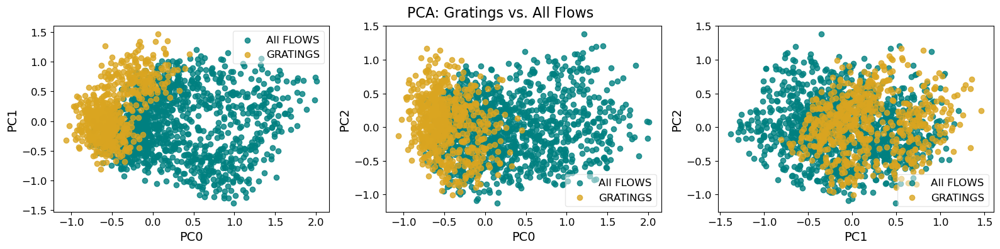

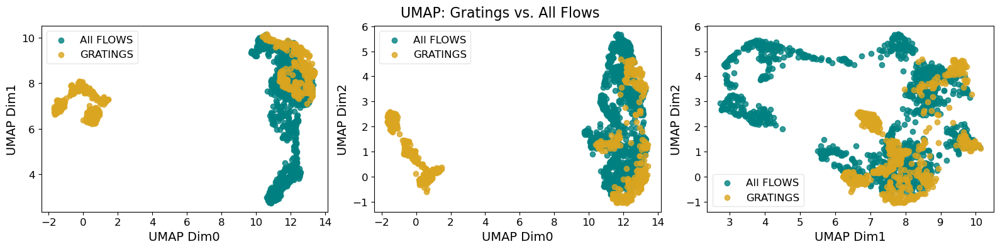

In [52]:
### GRATINGS vs. all FLOWS (PCA and UMAP)

PCs = [(0,1), (0,2), (1,2)]

# pca
labels_to_use = stimulus_labels
gratings_vs_flows = np.zeros_like(stimulus_labels)

for i in gratings_lf_ixs:
    gratings_vs_flows[(stimulus_labels == i)] = 1
for i in gratings_hf_ixs:
    gratings_vs_flows[(stimulus_labels == i)] = 1

f, axes = plt.subplots(1, len(PCs), figsize=(4*4, 4))

for ax, pcs in zip(axes, PCs):
    # Separate points into gratings and flows for custom legends
    gratings_mask = gratings_vs_flows == 1
    flows_mask = gratings_vs_flows == 0
    
    # Plot flows points
    ax.scatter(*Y[flows_mask][:, pcs].T, color=colors['M'], alpha=0.8, label='All FLOWS')
    # Plot gratings points
    ax.scatter(*Y[gratings_mask][:, pcs].T, color=colors['N'], alpha=0.8, label='GRATINGS')
    
    ax.set(xlabel=f'PC{pcs[0]}', ylabel=f'PC{pcs[1]}')

    ax.xaxis.label.set_size(14)
    ax.yaxis.label.set_size(14)
    ax.tick_params(labelsize=12)
    ax.legend(fontsize=12, framealpha=0.5)

f.tight_layout()
plt.suptitle('PCA: Gratings vs. All Flows', fontsize=16)
plt.subplots_adjust(top=0.9)
plt.show()


# umap

f, axes = plt.subplots(1, len(PCs), figsize=(4*4, 4))

for ax, pcs in zip(axes, PCs):
    # Separate points into gratings and flows for custom legends
    gratings_mask = gratings_vs_flows == 1
    flows_mask = gratings_vs_flows == 0
    
    # Plot flows points
    ax.scatter(*Y_umap[flows_mask][:, pcs].T, color=colors['M'], alpha=0.8, label='All FLOWS')
    # Plot gratings points
    ax.scatter(*Y_umap[gratings_mask][:, pcs].T, color=colors['N'], alpha=0.8, label='GRATINGS')
    
    ax.set(xlabel=f'UMAP Dim{pcs[0]}', ylabel=f'UMAP Dim{pcs[1]}')

    ax.xaxis.label.set_size(14)
    ax.yaxis.label.set_size(14)
    ax.tick_params(labelsize=12)
    ax.legend(fontsize=12, framealpha=0.5)

f.tight_layout()
plt.suptitle('UMAP: Gratings vs. All Flows', fontsize=16)
plt.subplots_adjust(top=0.9)
plt.show()

### Gratings directions

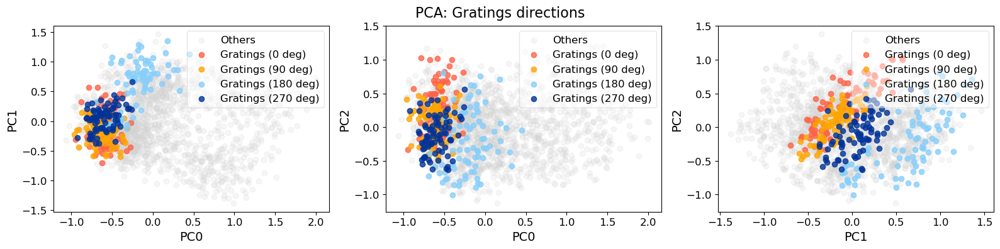

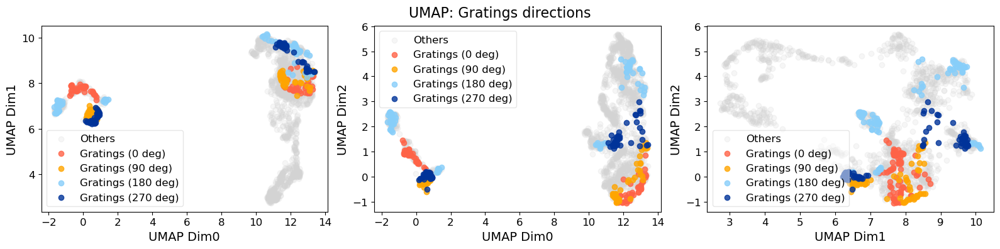

In [53]:
### Gratings directions (PCA and UMAP)

PCs = [(0,1), (0,2), (1,2)]

# pca
labels_to_use = stimulus_labels
gratings_dirs = np.zeros_like(stimulus_labels)
gratings_dirs[(stimulus_labels == gratings_lf_ixs[0])] = 1
gratings_dirs[(stimulus_labels == gratings_lf_ixs[2])] = 2
gratings_dirs[(stimulus_labels == gratings_lf_ixs[4])] = 3
gratings_dirs[(stimulus_labels == gratings_lf_ixs[6])] = 4
gratings_dirs[(stimulus_labels == gratings_hf_ixs[0])] = 1
gratings_dirs[(stimulus_labels == gratings_hf_ixs[2])] = 2
gratings_dirs[(stimulus_labels == gratings_hf_ixs[4])] = 3
gratings_dirs[(stimulus_labels == gratings_hf_ixs[6])] = 4

f, axes = plt.subplots(1, len(PCs), figsize=(4*4, 4))

for ax, pcs in zip(axes, PCs):
    d0_mask = gratings_dirs == 1
    d90_mask = gratings_dirs == 2
    d180_mask = gratings_dirs == 3
    d270_mask = gratings_dirs == 4
    others_mask = gratings_dirs == 0
    
    ax.scatter(*Y[others_mask][:, pcs].T, color=colors['Q'], alpha=0.2, label='Others')
    ax.scatter(*Y[d0_mask][:, pcs].T, color=colors['A'], alpha=0.8, label='Gratings (0 deg)')
    ax.scatter(*Y[d90_mask][:, pcs].T, color=colors['B'], alpha=0.8, label='Gratings (90 deg)')
    ax.scatter(*Y[d180_mask][:, pcs].T, color=colors['C'], alpha=0.8, label='Gratings (180 deg)')
    ax.scatter(*Y[d270_mask][:, pcs].T, color=colors['D'], alpha=0.8, label='Gratings (270 deg)')

    ax.set(xlabel=f'PC{pcs[0]}', ylabel=f'PC{pcs[1]}')
    
    ax.xaxis.label.set_size(14)
    ax.yaxis.label.set_size(14)
    ax.tick_params(labelsize=12)
    ax.legend(fontsize=12, framealpha=0.5)

f.tight_layout()
plt.suptitle('PCA: Gratings directions', fontsize=16)
plt.subplots_adjust(top=0.9)
plt.show()

# umap
f, axes = plt.subplots(1, len(PCs), figsize=(4*4, 4))

for ax, pcs in zip(axes, PCs):
    d0_mask = gratings_dirs == 1
    d90_mask = gratings_dirs == 2
    d180_mask = gratings_dirs == 3
    d270_mask = gratings_dirs == 4
    others_mask = gratings_dirs == 0
    
    ax.scatter(*Y_umap[others_mask][:, pcs].T, color=colors['Q'], alpha=0.2, label='Others')
    ax.scatter(*Y_umap[d0_mask][:, pcs].T, color=colors['A'], alpha=0.8, label='Gratings (0 deg)')
    ax.scatter(*Y_umap[d90_mask][:, pcs].T, color=colors['B'], alpha=0.8, label='Gratings (90 deg)')
    ax.scatter(*Y_umap[d180_mask][:, pcs].T, color=colors['C'], alpha=0.8, label='Gratings (180 deg)')
    ax.scatter(*Y_umap[d270_mask][:, pcs].T, color=colors['D'], alpha=0.8, label='Gratings (270 deg)')
    
    ax.set(xlabel=f'UMAP Dim{pcs[0]}', ylabel=f'UMAP Dim{pcs[1]}')
    
    ax.xaxis.label.set_size(14)
    ax.yaxis.label.set_size(14)
    ax.tick_params(labelsize=12)
    ax.legend(fontsize=12, framealpha=0.5)

f.tight_layout()
plt.suptitle('UMAP: Gratings directions', fontsize=16)
plt.subplots_adjust(top=0.9)
plt.show()

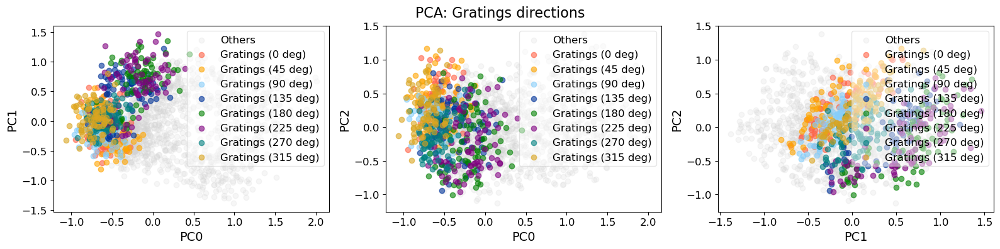

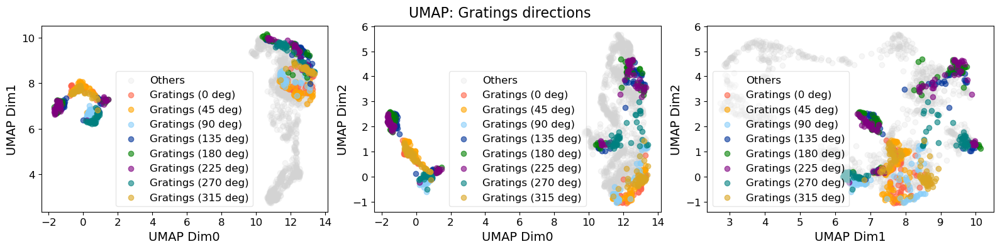

In [54]:
### Gratings directions (PCA and UMAP)

PCs = [(0,1), (0,2), (1,2)]

# pca
labels_to_use = stimulus_labels
gratings_dirs = np.zeros_like(stimulus_labels)
gratings_dirs[(stimulus_labels == gratings_lf_ixs[0])] = 10
gratings_dirs[(stimulus_labels == gratings_lf_ixs[1])] = 1
gratings_dirs[(stimulus_labels == gratings_lf_ixs[2])] = 2
gratings_dirs[(stimulus_labels == gratings_lf_ixs[3])] = 3
gratings_dirs[(stimulus_labels == gratings_lf_ixs[4])] = 4
gratings_dirs[(stimulus_labels == gratings_lf_ixs[5])] = 5
gratings_dirs[(stimulus_labels == gratings_lf_ixs[6])] = 6
gratings_dirs[(stimulus_labels == gratings_lf_ixs[7])] = 7
gratings_dirs[(stimulus_labels == gratings_hf_ixs[0])] = 10
gratings_dirs[(stimulus_labels == gratings_hf_ixs[1])] = 1
gratings_dirs[(stimulus_labels == gratings_hf_ixs[2])] = 2
gratings_dirs[(stimulus_labels == gratings_hf_ixs[3])] = 3
gratings_dirs[(stimulus_labels == gratings_hf_ixs[4])] = 4
gratings_dirs[(stimulus_labels == gratings_hf_ixs[5])] = 5
gratings_dirs[(stimulus_labels == gratings_hf_ixs[6])] = 6
gratings_dirs[(stimulus_labels == gratings_hf_ixs[7])] = 7

d0_mask = gratings_dirs == 10
d45_mask = gratings_dirs == 1
d90_mask = gratings_dirs == 2
d135_mask = gratings_dirs == 3
d180_mask = gratings_dirs == 4
d225_mask = gratings_dirs == 5
d270_mask = gratings_dirs == 6
d315_mask = gratings_dirs == 7
others_mask = gratings_dirs == 0

f, axes = plt.subplots(1, len(PCs), figsize=(4*4, 4))

for ax, pcs in zip(axes, PCs):
    
    ax.scatter(*Y[others_mask][:, pcs].T, color=colors['Q'], alpha=0.2, label='Others')
    ax.scatter(*Y[d0_mask][:, pcs].T, color=colors['A'], alpha=0.6, label='Gratings (0 deg)')
    ax.scatter(*Y[d45_mask][:, pcs].T, color=colors['B'], alpha=0.6, label='Gratings (45 deg)')
    ax.scatter(*Y[d90_mask][:, pcs].T, color=colors['C'], alpha=0.6, label='Gratings (90 deg)')
    ax.scatter(*Y[d135_mask][:, pcs].T, color=colors['D'], alpha=0.6, label='Gratings (135 deg)')
    ax.scatter(*Y[d180_mask][:, pcs].T, color=colors['I'], alpha=0.6, label='Gratings (180 deg)')
    ax.scatter(*Y[d225_mask][:, pcs].T, color=colors['J'], alpha=0.6, label='Gratings (225 deg)')
    ax.scatter(*Y[d270_mask][:, pcs].T, color=colors['M'], alpha=0.6, label='Gratings (270 deg)')
    ax.scatter(*Y[d315_mask][:, pcs].T, color=colors['N'], alpha=0.6, label='Gratings (315 deg)')

    ax.set(xlabel=f'PC{pcs[0]}', ylabel=f'PC{pcs[1]}')
    
    ax.xaxis.label.set_size(14)
    ax.yaxis.label.set_size(14)
    ax.tick_params(labelsize=12)
    ax.legend(fontsize=12, framealpha=0.5)

f.tight_layout()
plt.suptitle('PCA: Gratings directions', fontsize=16)
plt.subplots_adjust(top=0.9)
plt.show()

# umap
f, axes = plt.subplots(1, len(PCs), figsize=(4*4, 4))

for ax, pcs in zip(axes, PCs):
    
    ax.scatter(*Y_umap[others_mask][:, pcs].T, color=colors['Q'], alpha=0.2, label='Others')
    ax.scatter(*Y_umap[d0_mask][:, pcs].T, color=colors['A'], alpha=0.6, label='Gratings (0 deg)')
    ax.scatter(*Y_umap[d45_mask][:, pcs].T, color=colors['B'], alpha=0.6, label='Gratings (45 deg)')
    ax.scatter(*Y_umap[d90_mask][:, pcs].T, color=colors['C'], alpha=0.6, label='Gratings (90 deg)')
    ax.scatter(*Y_umap[d135_mask][:, pcs].T, color=colors['D'], alpha=0.6, label='Gratings (135 deg)')
    ax.scatter(*Y_umap[d180_mask][:, pcs].T, color=colors['I'], alpha=0.6, label='Gratings (180 deg)')
    ax.scatter(*Y_umap[d225_mask][:, pcs].T, color=colors['J'], alpha=0.6, label='Gratings (225 deg)')
    ax.scatter(*Y_umap[d270_mask][:, pcs].T, color=colors['M'], alpha=0.6, label='Gratings (270 deg)')
    ax.scatter(*Y_umap[d315_mask][:, pcs].T, color=colors['N'], alpha=0.6, label='Gratings (315 deg)')
    
    ax.set(xlabel=f'UMAP Dim{pcs[0]}', ylabel=f'UMAP Dim{pcs[1]}')
    
    ax.xaxis.label.set_size(14)
    ax.yaxis.label.set_size(14)
    ax.tick_params(labelsize=12)
    ax.legend(fontsize=12, framealpha=0.5)

f.tight_layout()
plt.suptitle('UMAP: Gratings directions', fontsize=16)
plt.subplots_adjust(top=0.9)
plt.show()

### Gratings freqs

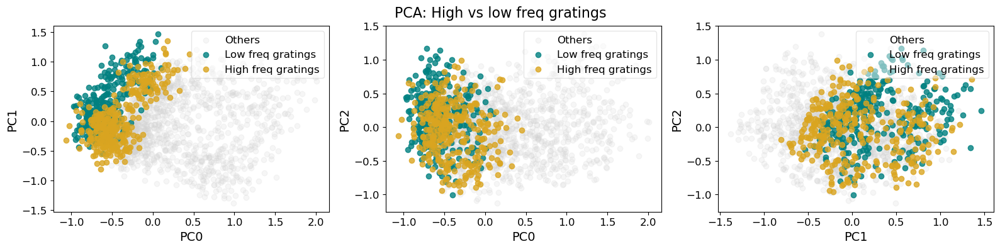

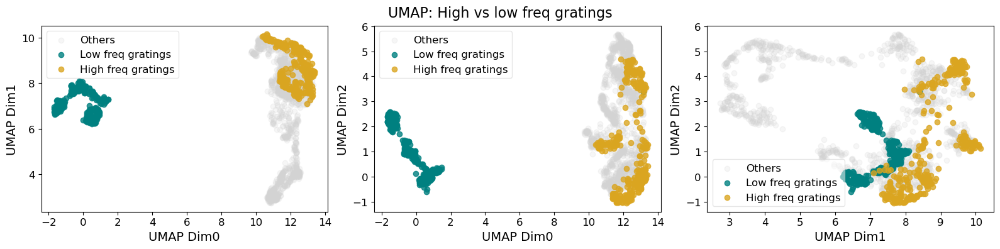

In [55]:
### High vs low freq gratings (PCA and UMAP)

PCs = [(0,1), (0,2), (1,2)]

# pca
labels_to_use = stimulus_labels
high_vs_low_freqs = np.zeros_like(stimulus_labels)

for i in gratings_hf_ixs:
    high_vs_low_freqs[(stimulus_labels == i)] = -1
for i in gratings_lf_ixs:
    high_vs_low_freqs[(stimulus_labels == i)] = 1

high_freq_mask = high_vs_low_freqs == -1
low_freq_mask = high_vs_low_freqs == 1
others_mask = high_vs_low_freqs == 0

f, axes = plt.subplots(1, len(PCs), figsize=(4*4, 4))

for ax, pcs in zip(axes, PCs):
    
    ax.scatter(*Y[others_mask][:, pcs].T, color=colors['Q'], alpha=0.2, label='Others')
    ax.scatter(*Y[low_freq_mask][:, pcs].T, color=colors['M'], alpha=0.8, label='Low freq gratings')
    ax.scatter(*Y[high_freq_mask][:, pcs].T, color=colors['N'], alpha=0.8, label='High freq gratings')

    ax.set(xlabel=f'PC{pcs[0]}', ylabel=f'PC{pcs[1]}')

    ax.xaxis.label.set_size(14)
    ax.yaxis.label.set_size(14)
    ax.tick_params(labelsize=12)
    ax.legend(fontsize=12, framealpha=0.5)

f.tight_layout()
plt.suptitle('PCA: High vs low freq gratings', fontsize=16)
plt.subplots_adjust(top=0.9)
plt.show()

# umap

f, axes = plt.subplots(1, len(PCs), figsize=(4*4, 4))

for ax, pcs in zip(axes, PCs):
    
    ax.scatter(*Y_umap[others_mask][:, pcs].T, color=colors['Q'], alpha=0.2, label='Others')
    ax.scatter(*Y_umap[low_freq_mask][:, pcs].T, color=colors['M'], alpha=0.8, label='Low freq gratings')
    ax.scatter(*Y_umap[high_freq_mask][:, pcs].T, color=colors['N'], alpha=0.8, label='High freq gratings')
    
    ax.set(xlabel=f'UMAP Dim{pcs[0]}', ylabel=f'UMAP Dim{pcs[1]}')

    ax.xaxis.label.set_size(14)
    ax.yaxis.label.set_size(14)
    ax.tick_params(labelsize=12)
    ax.legend(fontsize=12, framealpha=0.5)

f.tight_layout()
plt.suptitle('UMAP: High vs low freq gratings', fontsize=16)
plt.subplots_adjust(top=0.9)
plt.show()

### Pos flows directions

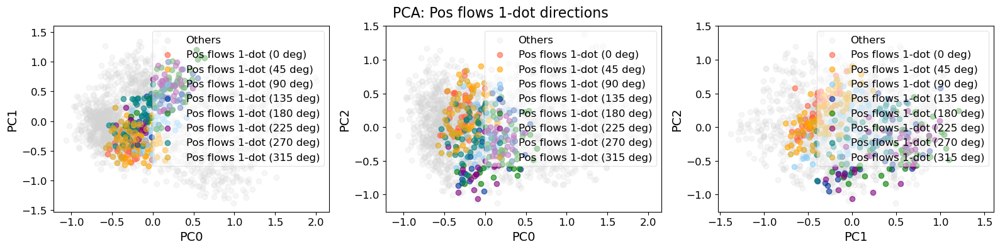

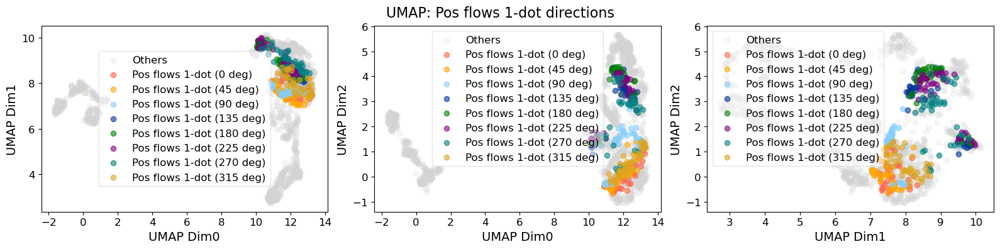

In [56]:
### Pos flows directions (1-dot, PCA and UMAP)

PCs = [(0,1), (0,2), (1,2)]

# pca
labels_to_use = stimulus_labels
flow_dirs = np.zeros_like(stimulus_labels)
flow_dirs[(stimulus_labels == pos_1flows_ixs[0])] = 10
flow_dirs[(stimulus_labels == pos_1flows_ixs[1])] = 1
flow_dirs[(stimulus_labels == pos_1flows_ixs[2])] = 2
flow_dirs[(stimulus_labels == pos_1flows_ixs[3])] = 3
flow_dirs[(stimulus_labels == pos_1flows_ixs[4])] = 4
flow_dirs[(stimulus_labels == pos_1flows_ixs[5])] = 5
flow_dirs[(stimulus_labels == pos_1flows_ixs[6])] = 6
flow_dirs[(stimulus_labels == pos_1flows_ixs[7])] = 7

d0_mask = flow_dirs == 10
d45_mask = flow_dirs == 1
d90_mask = flow_dirs == 2
d135_mask = flow_dirs == 3
d180_mask = flow_dirs == 4
d225_mask = flow_dirs == 5
d270_mask = flow_dirs == 6
d315_mask = flow_dirs == 7
others_mask = flow_dirs == 0

f, axes = plt.subplots(1, len(PCs), figsize=(4*4, 4))

for ax, pcs in zip(axes, PCs):
    
    ax.scatter(*Y[others_mask][:, pcs].T, color=colors['Q'], alpha=0.2, label='Others')
    ax.scatter(*Y[d0_mask][:, pcs].T, color=colors['A'], alpha=0.6, label='Pos flows 1-dot (0 deg)')
    ax.scatter(*Y[d45_mask][:, pcs].T, color=colors['B'], alpha=0.6, label='Pos flows 1-dot (45 deg)')
    ax.scatter(*Y[d90_mask][:, pcs].T, color=colors['C'], alpha=0.6, label='Pos flows 1-dot (90 deg)')
    ax.scatter(*Y[d135_mask][:, pcs].T, color=colors['D'], alpha=0.6, label='Pos flows 1-dot (135 deg)')
    ax.scatter(*Y[d180_mask][:, pcs].T, color=colors['I'], alpha=0.6, label='Pos flows 1-dot (180 deg)')
    ax.scatter(*Y[d225_mask][:, pcs].T, color=colors['J'], alpha=0.6, label='Pos flows 1-dot (225 deg)')
    ax.scatter(*Y[d270_mask][:, pcs].T, color=colors['M'], alpha=0.6, label='Pos flows 1-dot (270 deg)')
    ax.scatter(*Y[d315_mask][:, pcs].T, color=colors['N'], alpha=0.6, label='Pos flows 1-dot (315 deg)')

    ax.set(xlabel=f'PC{pcs[0]}', ylabel=f'PC{pcs[1]}')
    
    ax.xaxis.label.set_size(14)
    ax.yaxis.label.set_size(14)
    ax.tick_params(labelsize=12)
    ax.legend(fontsize=12, framealpha=0.5)

f.tight_layout()
plt.suptitle('PCA: Pos flows 1-dot directions', fontsize=16)
plt.subplots_adjust(top=0.9)
plt.show()

# umap
f, axes = plt.subplots(1, len(PCs), figsize=(4*4, 4))

for ax, pcs in zip(axes, PCs):
    
    ax.scatter(*Y_umap[others_mask][:, pcs].T, color=colors['Q'], alpha=0.2, label='Others')
    ax.scatter(*Y_umap[d0_mask][:, pcs].T, color=colors['A'], alpha=0.6, label='Pos flows 1-dot (0 deg)')
    ax.scatter(*Y_umap[d45_mask][:, pcs].T, color=colors['B'], alpha=0.6, label='Pos flows 1-dot (45 deg)')
    ax.scatter(*Y_umap[d90_mask][:, pcs].T, color=colors['C'], alpha=0.6, label='Pos flows 1-dot (90 deg)')
    ax.scatter(*Y_umap[d135_mask][:, pcs].T, color=colors['D'], alpha=0.6, label='Pos flows 1-dot (135 deg)')
    ax.scatter(*Y_umap[d180_mask][:, pcs].T, color=colors['I'], alpha=0.6, label='Pos flows 1-dot (180 deg)')
    ax.scatter(*Y_umap[d225_mask][:, pcs].T, color=colors['J'], alpha=0.6, label='Pos flows 1-dot (225 deg)')
    ax.scatter(*Y_umap[d270_mask][:, pcs].T, color=colors['M'], alpha=0.6, label='Pos flows 1-dot (270 deg)')
    ax.scatter(*Y_umap[d315_mask][:, pcs].T, color=colors['N'], alpha=0.6, label='Pos flows 1-dot (315 deg)')
    
    ax.set(xlabel=f'UMAP Dim{pcs[0]}', ylabel=f'UMAP Dim{pcs[1]}')
    
    ax.xaxis.label.set_size(14)
    ax.yaxis.label.set_size(14)
    ax.tick_params(labelsize=12)
    ax.legend(fontsize=12, framealpha=0.5)

f.tight_layout()
plt.suptitle('UMAP: Pos flows 1-dot directions', fontsize=16)
plt.subplots_adjust(top=0.9)
plt.show()

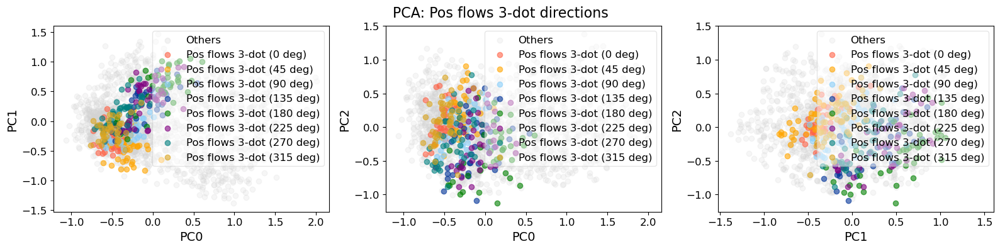

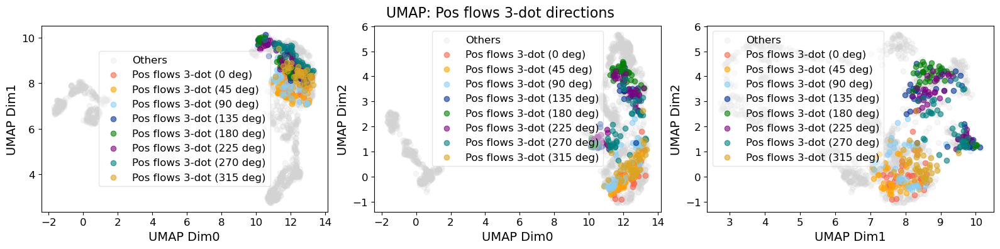

In [57]:
### Pos flows directions (3-dot, PCA and UMAP)

PCs = [(0,1), (0,2), (1,2)]

# pca
labels_to_use = stimulus_labels
flow_dirs = np.zeros_like(stimulus_labels)
flow_dirs[(stimulus_labels == pos_3flows_ixs[0])] = 10
flow_dirs[(stimulus_labels == pos_3flows_ixs[1])] = 1
flow_dirs[(stimulus_labels == pos_3flows_ixs[2])] = 2
flow_dirs[(stimulus_labels == pos_3flows_ixs[3])] = 3
flow_dirs[(stimulus_labels == pos_3flows_ixs[4])] = 4
flow_dirs[(stimulus_labels == pos_3flows_ixs[5])] = 5
flow_dirs[(stimulus_labels == pos_3flows_ixs[6])] = 6
flow_dirs[(stimulus_labels == pos_3flows_ixs[7])] = 7

d0_mask = flow_dirs == 10
d45_mask = flow_dirs == 1
d90_mask = flow_dirs == 2
d135_mask = flow_dirs == 3
d180_mask = flow_dirs == 4
d225_mask = flow_dirs == 5
d270_mask = flow_dirs == 6
d315_mask = flow_dirs == 7
others_mask = flow_dirs == 0

f, axes = plt.subplots(1, len(PCs), figsize=(4*4, 4))

for ax, pcs in zip(axes, PCs):
    
    ax.scatter(*Y[others_mask][:, pcs].T, color=colors['Q'], alpha=0.2, label='Others')
    ax.scatter(*Y[d0_mask][:, pcs].T, color=colors['A'], alpha=0.6, label='Pos flows 3-dot (0 deg)')
    ax.scatter(*Y[d45_mask][:, pcs].T, color=colors['B'], alpha=0.6, label='Pos flows 3-dot (45 deg)')
    ax.scatter(*Y[d90_mask][:, pcs].T, color=colors['C'], alpha=0.6, label='Pos flows 3-dot (90 deg)')
    ax.scatter(*Y[d135_mask][:, pcs].T, color=colors['D'], alpha=0.6, label='Pos flows 3-dot (135 deg)')
    ax.scatter(*Y[d180_mask][:, pcs].T, color=colors['I'], alpha=0.6, label='Pos flows 3-dot (180 deg)')
    ax.scatter(*Y[d225_mask][:, pcs].T, color=colors['J'], alpha=0.6, label='Pos flows 3-dot (225 deg)')
    ax.scatter(*Y[d270_mask][:, pcs].T, color=colors['M'], alpha=0.6, label='Pos flows 3-dot (270 deg)')
    ax.scatter(*Y[d315_mask][:, pcs].T, color=colors['N'], alpha=0.6, label='Pos flows 3-dot (315 deg)')

    ax.set(xlabel=f'PC{pcs[0]}', ylabel=f'PC{pcs[1]}')
    
    ax.xaxis.label.set_size(14)
    ax.yaxis.label.set_size(14)
    ax.tick_params(labelsize=12)
    ax.legend(fontsize=12, framealpha=0.5)

f.tight_layout()
plt.suptitle('PCA: Pos flows 3-dot directions', fontsize=16)
plt.subplots_adjust(top=0.9)
plt.show()

# umap
f, axes = plt.subplots(1, len(PCs), figsize=(4*4, 4))

for ax, pcs in zip(axes, PCs):
    
    ax.scatter(*Y_umap[others_mask][:, pcs].T, color=colors['Q'], alpha=0.2, label='Others')
    ax.scatter(*Y_umap[d0_mask][:, pcs].T, color=colors['A'], alpha=0.6, label='Pos flows 3-dot (0 deg)')
    ax.scatter(*Y_umap[d45_mask][:, pcs].T, color=colors['B'], alpha=0.6, label='Pos flows 3-dot (45 deg)')
    ax.scatter(*Y_umap[d90_mask][:, pcs].T, color=colors['C'], alpha=0.6, label='Pos flows 3-dot (90 deg)')
    ax.scatter(*Y_umap[d135_mask][:, pcs].T, color=colors['D'], alpha=0.6, label='Pos flows 3-dot (135 deg)')
    ax.scatter(*Y_umap[d180_mask][:, pcs].T, color=colors['I'], alpha=0.6, label='Pos flows 3-dot (180 deg)')
    ax.scatter(*Y_umap[d225_mask][:, pcs].T, color=colors['J'], alpha=0.6, label='Pos flows 3-dot (225 deg)')
    ax.scatter(*Y_umap[d270_mask][:, pcs].T, color=colors['M'], alpha=0.6, label='Pos flows 3-dot (270 deg)')
    ax.scatter(*Y_umap[d315_mask][:, pcs].T, color=colors['N'], alpha=0.6, label='Pos flows 3-dot (315 deg)')
    
    ax.set(xlabel=f'UMAP Dim{pcs[0]}', ylabel=f'UMAP Dim{pcs[1]}')
    
    ax.xaxis.label.set_size(14)
    ax.yaxis.label.set_size(14)
    ax.tick_params(labelsize=12)
    ax.legend(fontsize=12, framealpha=0.5)

f.tight_layout()
plt.suptitle('UMAP: Pos flows 3-dot directions', fontsize=16)
plt.subplots_adjust(top=0.9)
plt.show()

### Neg flows directions

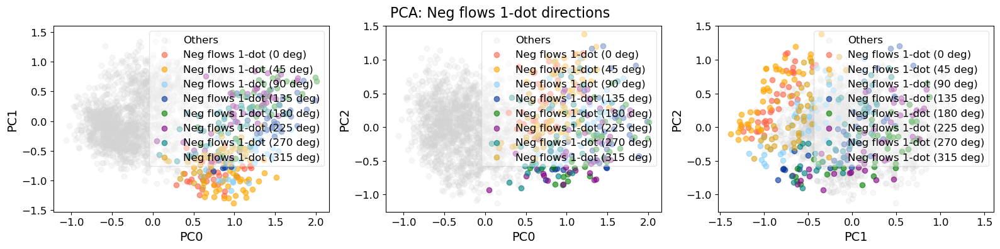

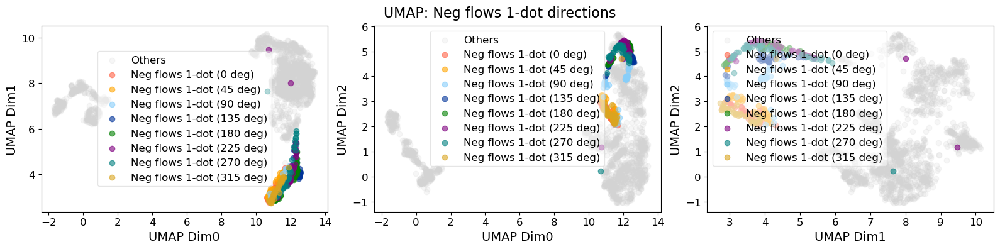

In [58]:
### Neg flows directions (1-dot, PCA and UMAP)

PCs = [(0,1), (0,2), (1,2)]

# pca
labels_to_use = stimulus_labels
flow_dirs = np.zeros_like(stimulus_labels)
flow_dirs[(stimulus_labels == neg_1flows_ixs[0])] = 10
flow_dirs[(stimulus_labels == neg_1flows_ixs[1])] = 1
flow_dirs[(stimulus_labels == neg_1flows_ixs[2])] = 2
flow_dirs[(stimulus_labels == neg_1flows_ixs[3])] = 3
flow_dirs[(stimulus_labels == neg_1flows_ixs[4])] = 4
flow_dirs[(stimulus_labels == neg_1flows_ixs[5])] = 5
flow_dirs[(stimulus_labels == neg_1flows_ixs[6])] = 6
flow_dirs[(stimulus_labels == neg_1flows_ixs[7])] = 7

d0_mask = flow_dirs == 10
d45_mask = flow_dirs == 1
d90_mask = flow_dirs == 2
d135_mask = flow_dirs == 3
d180_mask = flow_dirs == 4
d225_mask = flow_dirs == 5
d270_mask = flow_dirs == 6
d315_mask = flow_dirs == 7
others_mask = flow_dirs == 0

f, axes = plt.subplots(1, len(PCs), figsize=(4*4, 4))

for ax, pcs in zip(axes, PCs):
    
    ax.scatter(*Y[others_mask][:, pcs].T, color=colors['Q'], alpha=0.2, label='Others')
    ax.scatter(*Y[d0_mask][:, pcs].T, color=colors['A'], alpha=0.6, label='Neg flows 1-dot (0 deg)')
    ax.scatter(*Y[d45_mask][:, pcs].T, color=colors['B'], alpha=0.6, label='Neg flows 1-dot (45 deg)')
    ax.scatter(*Y[d90_mask][:, pcs].T, color=colors['C'], alpha=0.6, label='Neg flows 1-dot (90 deg)')
    ax.scatter(*Y[d135_mask][:, pcs].T, color=colors['D'], alpha=0.6, label='Neg flows 1-dot (135 deg)')
    ax.scatter(*Y[d180_mask][:, pcs].T, color=colors['I'], alpha=0.6, label='Neg flows 1-dot (180 deg)')
    ax.scatter(*Y[d225_mask][:, pcs].T, color=colors['J'], alpha=0.6, label='Neg flows 1-dot (225 deg)')
    ax.scatter(*Y[d270_mask][:, pcs].T, color=colors['M'], alpha=0.6, label='Neg flows 1-dot (270 deg)')
    ax.scatter(*Y[d315_mask][:, pcs].T, color=colors['N'], alpha=0.6, label='Neg flows 1-dot (315 deg)')

    ax.set(xlabel=f'PC{pcs[0]}', ylabel=f'PC{pcs[1]}')
    
    ax.xaxis.label.set_size(14)
    ax.yaxis.label.set_size(14)
    ax.tick_params(labelsize=12)
    ax.legend(fontsize=12, framealpha=0.5)

f.tight_layout()
plt.suptitle('PCA: Neg flows 1-dot directions', fontsize=16)
plt.subplots_adjust(top=0.9)
plt.show()

# umap
f, axes = plt.subplots(1, len(PCs), figsize=(4*4, 4))

for ax, pcs in zip(axes, PCs):
    
    ax.scatter(*Y_umap[others_mask][:, pcs].T, color=colors['Q'], alpha=0.2, label='Others')
    ax.scatter(*Y_umap[d0_mask][:, pcs].T, color=colors['A'], alpha=0.6, label='Neg flows 1-dot (0 deg)')
    ax.scatter(*Y_umap[d45_mask][:, pcs].T, color=colors['B'], alpha=0.6, label='Neg flows 1-dot (45 deg)')
    ax.scatter(*Y_umap[d90_mask][:, pcs].T, color=colors['C'], alpha=0.6, label='Neg flows 1-dot (90 deg)')
    ax.scatter(*Y_umap[d135_mask][:, pcs].T, color=colors['D'], alpha=0.6, label='Neg flows 1-dot (135 deg)')
    ax.scatter(*Y_umap[d180_mask][:, pcs].T, color=colors['I'], alpha=0.6, label='Neg flows 1-dot (180 deg)')
    ax.scatter(*Y_umap[d225_mask][:, pcs].T, color=colors['J'], alpha=0.6, label='Neg flows 1-dot (225 deg)')
    ax.scatter(*Y_umap[d270_mask][:, pcs].T, color=colors['M'], alpha=0.6, label='Neg flows 1-dot (270 deg)')
    ax.scatter(*Y_umap[d315_mask][:, pcs].T, color=colors['N'], alpha=0.6, label='Neg flows 1-dot (315 deg)')
    
    ax.set(xlabel=f'UMAP Dim{pcs[0]}', ylabel=f'UMAP Dim{pcs[1]}')
    
    ax.xaxis.label.set_size(14)
    ax.yaxis.label.set_size(14)
    ax.tick_params(labelsize=12)
    ax.legend(fontsize=12, framealpha=0.5)

f.tight_layout()
plt.suptitle('UMAP: Neg flows 1-dot directions', fontsize=16)
plt.subplots_adjust(top=0.9)
plt.show()

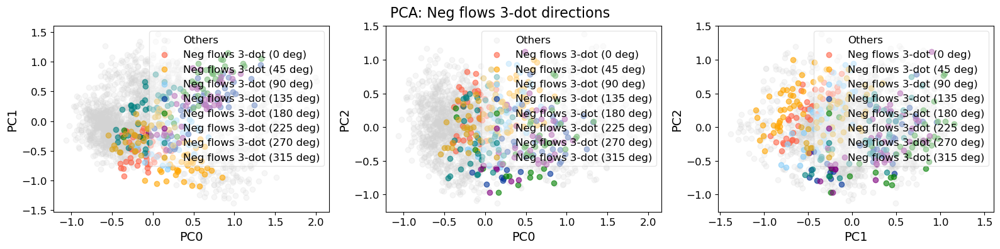

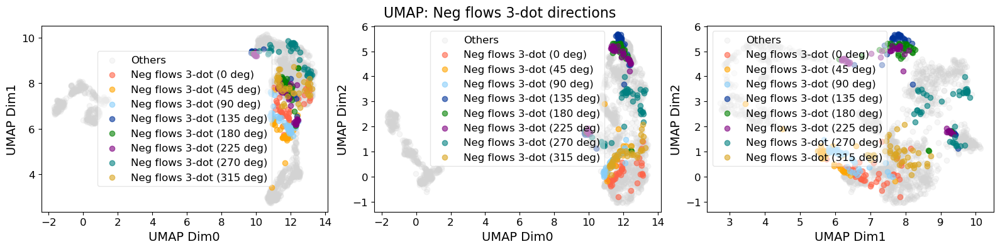

In [59]:
### Neg flows directions (3-dot, PCA and UMAP)

PCs = [(0,1), (0,2), (1,2)]

# pca
labels_to_use = stimulus_labels
flow_dirs = np.zeros_like(stimulus_labels)
flow_dirs[(stimulus_labels == neg_3flows_ixs[0])] = 10
flow_dirs[(stimulus_labels == neg_3flows_ixs[1])] = 1
flow_dirs[(stimulus_labels == neg_3flows_ixs[2])] = 2
flow_dirs[(stimulus_labels == neg_3flows_ixs[3])] = 3
flow_dirs[(stimulus_labels == neg_3flows_ixs[4])] = 4
flow_dirs[(stimulus_labels == neg_3flows_ixs[5])] = 5
flow_dirs[(stimulus_labels == neg_3flows_ixs[6])] = 6
flow_dirs[(stimulus_labels == neg_3flows_ixs[7])] = 7

d0_mask = flow_dirs == 10
d45_mask = flow_dirs == 1
d90_mask = flow_dirs == 2
d135_mask = flow_dirs == 3
d180_mask = flow_dirs == 4
d225_mask = flow_dirs == 5
d270_mask = flow_dirs == 6
d315_mask = flow_dirs == 7
others_mask = flow_dirs == 0

f, axes = plt.subplots(1, len(PCs), figsize=(4*4, 4))

for ax, pcs in zip(axes, PCs):
    
    ax.scatter(*Y[others_mask][:, pcs].T, color=colors['Q'], alpha=0.2, label='Others')
    ax.scatter(*Y[d0_mask][:, pcs].T, color=colors['A'], alpha=0.6, label='Neg flows 3-dot (0 deg)')
    ax.scatter(*Y[d45_mask][:, pcs].T, color=colors['B'], alpha=0.6, label='Neg flows 3-dot (45 deg)')
    ax.scatter(*Y[d90_mask][:, pcs].T, color=colors['C'], alpha=0.6, label='Neg flows 3-dot (90 deg)')
    ax.scatter(*Y[d135_mask][:, pcs].T, color=colors['D'], alpha=0.6, label='Neg flows 3-dot (135 deg)')
    ax.scatter(*Y[d180_mask][:, pcs].T, color=colors['I'], alpha=0.6, label='Neg flows 3-dot (180 deg)')
    ax.scatter(*Y[d225_mask][:, pcs].T, color=colors['J'], alpha=0.6, label='Neg flows 3-dot (225 deg)')
    ax.scatter(*Y[d270_mask][:, pcs].T, color=colors['M'], alpha=0.6, label='Neg flows 3-dot (270 deg)')
    ax.scatter(*Y[d315_mask][:, pcs].T, color=colors['N'], alpha=0.6, label='Neg flows 3-dot (315 deg)')

    ax.set(xlabel=f'PC{pcs[0]}', ylabel=f'PC{pcs[1]}')
    
    ax.xaxis.label.set_size(14)
    ax.yaxis.label.set_size(14)
    ax.tick_params(labelsize=12)
    ax.legend(fontsize=12, framealpha=0.5)

f.tight_layout()
plt.suptitle('PCA: Neg flows 3-dot directions', fontsize=16)
plt.subplots_adjust(top=0.9)
plt.show()

# umap
f, axes = plt.subplots(1, len(PCs), figsize=(4*4, 4))

for ax, pcs in zip(axes, PCs):
    
    ax.scatter(*Y_umap[others_mask][:, pcs].T, color=colors['Q'], alpha=0.2, label='Others')
    ax.scatter(*Y_umap[d0_mask][:, pcs].T, color=colors['A'], alpha=0.6, label='Neg flows 3-dot (0 deg)')
    ax.scatter(*Y_umap[d45_mask][:, pcs].T, color=colors['B'], alpha=0.6, label='Neg flows 3-dot (45 deg)')
    ax.scatter(*Y_umap[d90_mask][:, pcs].T, color=colors['C'], alpha=0.6, label='Neg flows 3-dot (90 deg)')
    ax.scatter(*Y_umap[d135_mask][:, pcs].T, color=colors['D'], alpha=0.6, label='Neg flows 3-dot (135 deg)')
    ax.scatter(*Y_umap[d180_mask][:, pcs].T, color=colors['I'], alpha=0.6, label='Neg flows 3-dot (180 deg)')
    ax.scatter(*Y_umap[d225_mask][:, pcs].T, color=colors['J'], alpha=0.6, label='Neg flows 3-dot (225 deg)')
    ax.scatter(*Y_umap[d270_mask][:, pcs].T, color=colors['M'], alpha=0.6, label='Neg flows 3-dot (270 deg)')
    ax.scatter(*Y_umap[d315_mask][:, pcs].T, color=colors['N'], alpha=0.6, label='Neg flows 3-dot (315 deg)')
    
    ax.set(xlabel=f'UMAP Dim{pcs[0]}', ylabel=f'UMAP Dim{pcs[1]}')
    
    ax.xaxis.label.set_size(14)
    ax.yaxis.label.set_size(14)
    ax.tick_params(labelsize=12)
    ax.legend(fontsize=12, framealpha=0.5)

f.tight_layout()
plt.suptitle('UMAP: Neg flows 3-dot directions', fontsize=16)
plt.subplots_adjust(top=0.9)
plt.show()

### Pos vs neg flows (1-dot)

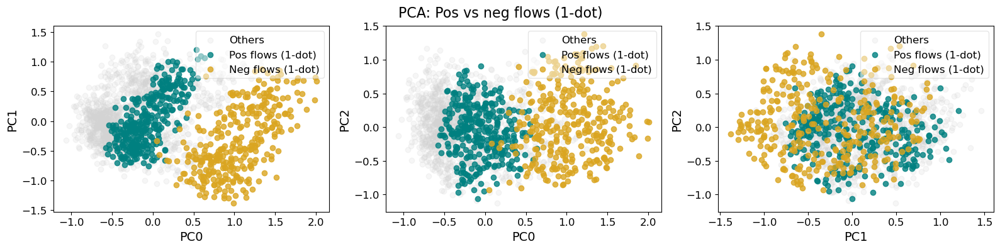

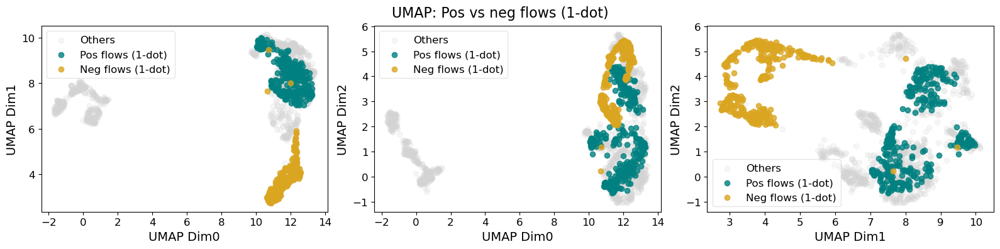

In [60]:
### Pos vs neg flows (1-dot) (PCA and UMAP)

PCs = [(0,1), (0,2), (1,2)]

# pca
labels_to_use = stimulus_labels
pos_vs_neg_flows = np.zeros_like(stimulus_labels)

for i in neg_1flows_ixs:
    pos_vs_neg_flows[(stimulus_labels == i)] = -1
for i in pos_1flows_ixs:
    pos_vs_neg_flows[(stimulus_labels == i)] = 1

f, axes = plt.subplots(1, len(PCs), figsize=(4*4, 4))

for ax, pcs in zip(axes, PCs):
    neg_flows_mask = pos_vs_neg_flows == -1
    pos_flows_mask = pos_vs_neg_flows == 1
    others_mask = pos_vs_neg_flows == 0
    
    ax.scatter(*Y[others_mask][:, pcs].T, color=colors['Q'], alpha=0.2, label='Others')
    ax.scatter(*Y[pos_flows_mask][:, pcs].T, color=colors['M'], alpha=0.8, label='Pos flows (1-dot)')
    ax.scatter(*Y[neg_flows_mask][:, pcs].T, color=colors['N'], alpha=0.8, label='Neg flows (1-dot)')

    ax.set(xlabel=f'PC{pcs[0]}', ylabel=f'PC{pcs[1]}')

    ax.xaxis.label.set_size(14)
    ax.yaxis.label.set_size(14)
    ax.tick_params(labelsize=12)
    ax.legend(fontsize=12, framealpha=0.5)

f.tight_layout()
plt.suptitle('PCA: Pos vs neg flows (1-dot)', fontsize=16)
plt.subplots_adjust(top=0.9)
plt.show()

# umap

f, axes = plt.subplots(1, len(PCs), figsize=(4*4, 4))

for ax, pcs in zip(axes, PCs):
    neg_flows_mask = pos_vs_neg_flows == -1
    pos_flows_mask = pos_vs_neg_flows == 1
    others_mask = pos_vs_neg_flows == 0
    
    ax.scatter(*Y_umap[others_mask][:, pcs].T, color=colors['Q'], alpha=0.2, label='Others')
    ax.scatter(*Y_umap[pos_flows_mask][:, pcs].T, color=colors['M'], alpha=0.8, label='Pos flows (1-dot)')
    ax.scatter(*Y_umap[neg_flows_mask][:, pcs].T, color=colors['N'], alpha=0.8, label='Neg flows (1-dot)')
    
    ax.set(xlabel=f'UMAP Dim{pcs[0]}', ylabel=f'UMAP Dim{pcs[1]}')

    ax.xaxis.label.set_size(14)
    ax.yaxis.label.set_size(14)
    ax.tick_params(labelsize=12)
    ax.legend(fontsize=12, framealpha=0.5)

f.tight_layout()
plt.suptitle('UMAP: Pos vs neg flows (1-dot)', fontsize=16)
plt.subplots_adjust(top=0.9)
plt.show()

### Pos vs neg flows (3-dot)

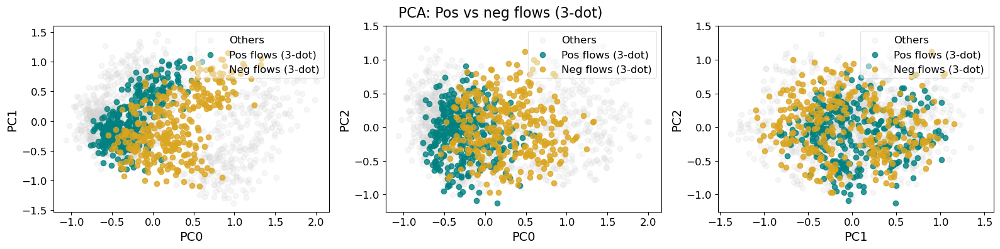

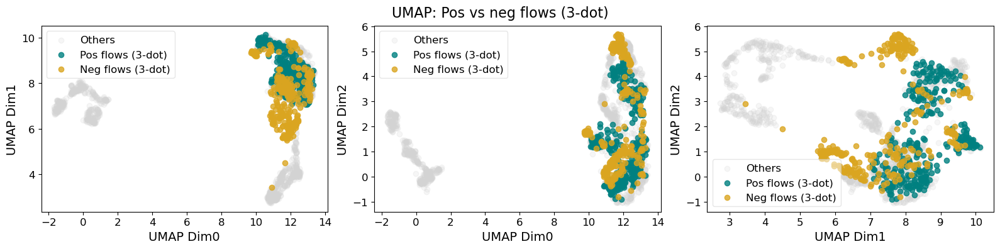

In [61]:
### Pos vs neg flows (3-dot) (PCA and UMAP)

PCs = [(0,1), (0,2), (1,2)]

# pca
labels_to_use = stimulus_labels
pos_vs_neg_flows = np.zeros_like(stimulus_labels)

for i in neg_3flows_ixs:
    pos_vs_neg_flows[(stimulus_labels == i)] = -1
for i in pos_3flows_ixs:
    pos_vs_neg_flows[(stimulus_labels == i)] = 1

f, axes = plt.subplots(1, len(PCs), figsize=(4*4, 4))

for ax, pcs in zip(axes, PCs):
    neg_flows_mask = pos_vs_neg_flows == -1
    pos_flows_mask = pos_vs_neg_flows == 1
    others_mask = pos_vs_neg_flows == 0
    
    ax.scatter(*Y[others_mask][:, pcs].T, color=colors['Q'], alpha=0.2, label='Others')
    ax.scatter(*Y[pos_flows_mask][:, pcs].T, color=colors['M'], alpha=0.8, label='Pos flows (3-dot)')
    ax.scatter(*Y[neg_flows_mask][:, pcs].T, color=colors['N'], alpha=0.8, label='Neg flows (3-dot)')

    ax.set(xlabel=f'PC{pcs[0]}', ylabel=f'PC{pcs[1]}')

    ax.xaxis.label.set_size(14)
    ax.yaxis.label.set_size(14)
    ax.tick_params(labelsize=12)
    ax.legend(fontsize=12, framealpha=0.5)

f.tight_layout()
plt.suptitle('PCA: Pos vs neg flows (3-dot)', fontsize=16)
plt.subplots_adjust(top=0.9)
plt.show()

# umap

f, axes = plt.subplots(1, len(PCs), figsize=(4*4, 4))

for ax, pcs in zip(axes, PCs):
    neg_flows_mask = pos_vs_neg_flows == -1
    pos_flows_mask = pos_vs_neg_flows == 1
    others_mask = pos_vs_neg_flows == 0
    
    ax.scatter(*Y_umap[others_mask][:, pcs].T, color=colors['Q'], alpha=0.2, label='Others')
    ax.scatter(*Y_umap[pos_flows_mask][:, pcs].T, color=colors['M'], alpha=0.8, label='Pos flows (3-dot)')
    ax.scatter(*Y_umap[neg_flows_mask][:, pcs].T, color=colors['N'], alpha=0.8, label='Neg flows (3-dot)')
    
    ax.set(xlabel=f'UMAP Dim{pcs[0]}', ylabel=f'UMAP Dim{pcs[1]}')

    ax.xaxis.label.set_size(14)
    ax.yaxis.label.set_size(14)
    ax.tick_params(labelsize=12)
    ax.legend(fontsize=12, framealpha=0.5)

f.tight_layout()
plt.suptitle('UMAP: Pos vs neg flows (3-dot)', fontsize=16)
plt.subplots_adjust(top=0.9)
plt.show()

### Pos vs neg flows (1 & 3-dot)

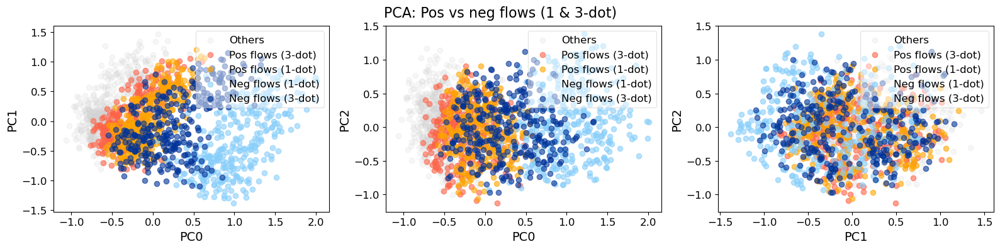

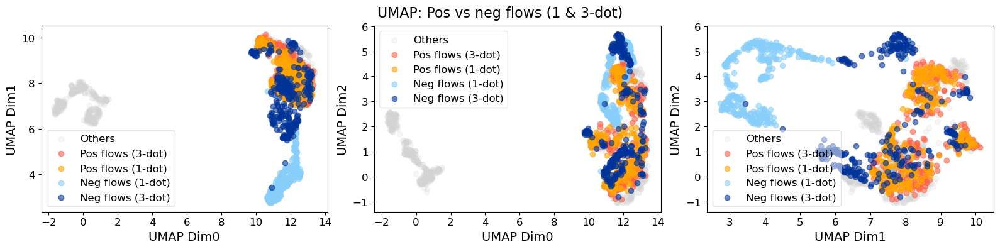

In [62]:
### Pos vs neg flows (1 & 3-dot) (PCA and UMAP)

PCs = [(0,1), (0,2), (1,2)]

# pca
labels_to_use = stimulus_labels
pos_vs_neg_flows = np.zeros_like(stimulus_labels)

for i in pos_3flows_ixs:
    pos_vs_neg_flows[(stimulus_labels == i)] = 1
for i in pos_1flows_ixs:
    pos_vs_neg_flows[(stimulus_labels == i)] = 2
for i in neg_1flows_ixs:
    pos_vs_neg_flows[(stimulus_labels == i)] = 3
for i in neg_3flows_ixs:
    pos_vs_neg_flows[(stimulus_labels == i)] = 4


f, axes = plt.subplots(1, len(PCs), figsize=(4*4, 4))

for ax, pcs in zip(axes, PCs):
    p3_mask = pos_vs_neg_flows == 1
    p1_mask = pos_vs_neg_flows == 2
    n1_mask = pos_vs_neg_flows == 3
    n3_mask = pos_vs_neg_flows == 4
    others_mask = pos_vs_neg_flows == 0
    
    ax.scatter(*Y[others_mask][:, pcs].T, color=colors['Q'], alpha=0.2, label='Others')
    ax.scatter(*Y[p3_mask][:, pcs].T, color=colors['A'], alpha=0.6, label='Pos flows (3-dot)')
    ax.scatter(*Y[p1_mask][:, pcs].T, color=colors['B'], alpha=0.6, label='Pos flows (1-dot)')
    ax.scatter(*Y[n1_mask][:, pcs].T, color=colors['C'], alpha=0.6, label='Neg flows (1-dot)')
    ax.scatter(*Y[n3_mask][:, pcs].T, color=colors['D'], alpha=0.6, label='Neg flows (3-dot)')

    ax.set(xlabel=f'PC{pcs[0]}', ylabel=f'PC{pcs[1]}')
    
    ax.xaxis.label.set_size(14)
    ax.yaxis.label.set_size(14)
    ax.tick_params(labelsize=12)
    ax.legend(fontsize=12, framealpha=0.5)

f.tight_layout()
plt.suptitle('PCA: Pos vs neg flows (1 & 3-dot)', fontsize=16)
plt.subplots_adjust(top=0.9)
plt.show()

# umap
f, axes = plt.subplots(1, len(PCs), figsize=(4*4, 4))

for ax, pcs in zip(axes, PCs):
    p3_mask = pos_vs_neg_flows == 1
    p1_mask = pos_vs_neg_flows == 2
    n1_mask = pos_vs_neg_flows == 3
    n3_mask = pos_vs_neg_flows == 4
    others_mask = pos_vs_neg_flows == 0
    
    ax.scatter(*Y_umap[others_mask][:, pcs].T, color=colors['Q'], alpha=0.2, label='Others')
    ax.scatter(*Y_umap[p3_mask][:, pcs].T, color=colors['A'], alpha=0.6, label='Pos flows (3-dot)')
    ax.scatter(*Y_umap[p1_mask][:, pcs].T, color=colors['B'], alpha=0.6, label='Pos flows (1-dot)')
    ax.scatter(*Y_umap[n1_mask][:, pcs].T, color=colors['C'], alpha=0.6, label='Neg flows (1-dot)')
    ax.scatter(*Y_umap[n3_mask][:, pcs].T, color=colors['D'], alpha=0.6, label='Neg flows (3-dot)')
    
    ax.set(xlabel=f'UMAP Dim{pcs[0]}', ylabel=f'UMAP Dim{pcs[1]}')
    
    ax.xaxis.label.set_size(14)
    ax.yaxis.label.set_size(14)
    ax.tick_params(labelsize=12)
    ax.legend(fontsize=12, framealpha=0.5)

f.tight_layout()
plt.suptitle('UMAP: Pos vs neg flows (1 & 3-dot)', fontsize=16)
plt.subplots_adjust(top=0.9)
plt.show()

# PCA & UMAP (reduce stimuli dim)

## Means

In [63]:
X = X.T # change to neuron dim for reduction
X.shape

(225, 1920)

(225, 20) <class 'numpy.ndarray'>


Text(0, 0.5, 'Explained Variance Ratio')

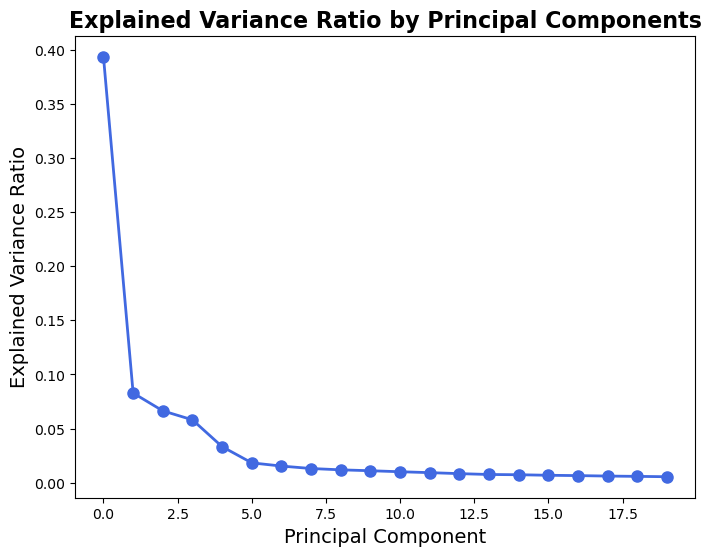

In [64]:
pca = PCA(20, random_state=1116)
Y = pca.fit_transform(X)
print(Y.shape, type(Y))

plt.figure(figsize=(8, 6))
plt.plot(pca.explained_variance_ratio_, color='royalblue', marker='o', linestyle='-', linewidth=2, markersize=8)
plt.title('Explained Variance Ratio by Principal Components', fontsize=16, fontweight='bold')
plt.xlabel('Principal Component', fontsize=14)
plt.ylabel('Explained Variance Ratio', fontsize=14)

In [65]:
# Initialize UMAP with the desired number of components
reducer = umap.UMAP(n_components=3, random_state=1116, n_jobs=1)

Y_umap = reducer.fit_transform(X)
print("Shape of Y_umap:", Y_umap.shape)

Shape of Y_umap: (225, 3)


In [66]:
Y_pca = Y[:,:3]  
Y_umap = Y_umap 

# Number of neurons
num_neurons = Y_pca.shape[0]
neuron_ids = [f"Neuron {i+1}" for i in range(num_neurons)]  # Creating labels for neurons

# =======================
# 3D PCA Plot
# =======================
fig_pca = go.Figure()

fig_pca.add_trace(go.Scatter3d(
    x=Y_pca[:, 0], 
    y=Y_pca[:, 1], 
    z=Y_pca[:, 2],
    mode='markers',
    marker=dict(size=6, color=np.arange(num_neurons), colorscale='Viridis', opacity=0.8),
    text=neuron_ids,  # Hover text for neuron IDs
    hoverinfo='text'
))

# Update PCA plot layout
fig_pca.update_layout(
    title='PCA: Neuron Responses in 3D',
    scene=dict(
        xaxis_title='PC 1',
        yaxis_title='PC 2',
        zaxis_title='PC 3'
    ),
    width=800,
    height=600
)

# Save the PCA plot as an HTML file
fig_pca.write_html('neuron_pca_of_means_3d_interactive.html')
fig_pca.show()

# =======================
# 3D UMAP Plot
# =======================
fig_umap = go.Figure()

fig_umap.add_trace(go.Scatter3d(
    x=Y_umap[:, 0], 
    y=Y_umap[:, 1], 
    z=Y_umap[:, 2],
    mode='markers',
    marker=dict(size=6, color=np.arange(num_neurons), colorscale='Cividis', opacity=0.8),
    text=neuron_ids,  # Hover text for neuron IDs
    hoverinfo='text'
))

# Update UMAP plot layout
fig_umap.update_layout(
    title='UMAP: Neuron Responses in 3D',
    scene=dict(
        xaxis_title='UMAP Dim 1',
        yaxis_title='UMAP Dim 2',
        zaxis_title='UMAP Dim 3'
    ),
    width=800,
    height=600
)

# Save the UMAP plot as an HTML file
fig_umap.write_html('neuron_umap_of_means_3d_interactive.html')
fig_umap.show()

# Manifold embedding

In [102]:
X_list = []
for exp in experiments:
    print(f"--- {exp} ---")
    prefix = '_'.join(exp.split('_')[:2]) + '_'
    mat_file_path = f'{data_folder}/{exp}/{prefix}Combined_dFFdotTraces.mat'
    with h5py.File(mat_file_path, 'r') as f:
        # Access the 'dFFdotTraces' dataset
        data = f['dFFdotTraces']

        N_STIMS, N_SESSIONS = data.shape
        N_REPS, N_NEURONS, N_FRAMES  = f[data[0, 0]].shape
        assert N_SESSIONS == 4

        # numpy_data tensor, is 36x4 which has at each cell 85x73x10
        numpy_data = np.zeros((N_STIMS, N_SESSIONS), dtype=object)
        for i in range(N_STIMS):
            for j in range(N_SESSIONS):
                if j > 1:
                    i_ = reorder_indices.index(i)
                else:
                    i_ = i
                temp_data = f[data[i,j]][:]
                numpy_data[i_, j] = temp_data
        
        all_nuerons_stimuli_traces = np.zeros((N_NEURONS, N_STIMS, N_SESSIONS*N_REPS, N_FRAMES))
        for ni in range(N_NEURONS):
            for si in range(N_STIMS):
                for session_i in range(N_SESSIONS):
                    start = session_i*N_REPS
                    end = (session_i+1)*N_REPS
                    all_nuerons_stimuli_traces[ni, si, start:end, :] = numpy_data[si,session_i][:,ni,:]

        X_ = np.mean(all_nuerons_stimuli_traces, axis=2) # (N_NEURONS, N_STIMS, N_FRAMES)

    X_list.append(X_)

X = np.concatenate(X_list, axis=0) # (N_NEURONS, N_STIMS, N_FRAMES), for each stim, use means of trials

print(f"X shape: {X.shape}") 

--- CC185_241025_ThresholdedNaN3_Combined ---
--- CC185_241026_ThresholdedNaN3_Combined ---
--- CC182_241028_ThresholdedNaN3_Combined ---
X shape: (225, 48, 85)


In [103]:
# reorder the stimuli dim
X_BetterLabel = np.zeros_like(X)
for new_index, old_index in enumerate(BetterLabel_indices):
    X_BetterLabel[:, new_index, :] = X[:, old_index, :]
X = X_BetterLabel

In [104]:
def normalize_tensor(data_tensor):
    norm_data = np.zeros_like(data_tensor)
    for i in range(data_tensor.shape[0]):  # Iterate over neurons

        for j in range(data_tensor.shape[1]):  # Iterate over stimuli
            response = data_tensor[i, j]
            norm = np.linalg.norm(response) # Frobenius norm
            if norm > 0: # 0 only if zero matrix
                norm_data[i, j] = response / norm

    return norm_data

X = normalize_tensor(X)

### Various indices

In [118]:
# Calculate the maximum for each group 
max_response_glf = np.max(X[:, 0:8, :], axis=(1, 2))  
max_response_ghf = np.max(X[:, 8:16, :], axis=(1, 2))  
max_response_nf1 = np.max(X[:, 16:24, :], axis=(1, 2))  
max_response_nf3 = np.max(X[:, 24:32, :], axis=(1, 2))  
max_response_pf1 = np.max(X[:, 32:40, :], axis=(1, 2))  
max_response_pf3 = np.max(X[:, 40:48, :], axis=(1, 2))  

# Calculate the maximum across all stimuli and frames 
max_response_all = np.max(X, axis=(1, 2))

# calculate relative response magnitudes
glf_relative = max_response_glf / max_response_all
ghf_relative = max_response_ghf / max_response_all
nf1_relative = max_response_nf1 / max_response_all
nf3_relative = max_response_nf3 / max_response_all
pf1_relative = max_response_pf1 / max_response_all
pf3_relative = max_response_pf3 / max_response_all

g_realtive = np.max(X[:, 0:16, :], axis=(1, 2)) / max_response_all
pf_relative = np.max(X[:, 32:48, :], axis=(1, 2)) / max_response_all
nf_relative = np.max(X[:, 16:32, :], axis=(1, 2)) / max_response_all
f_realtive = np.max(X[:, 16:48, :], axis=(1, 2)) / max_response_all

# calculate grating_selectivity_index and flow_polarity_index
grating_selectivity_index = g_realtive / (g_realtive + f_realtive)
flow_polarity_index = pf_relative - nf_relative

# Calculate relative response magnitudes for all 6 stimulus classes
relative_responses = np.stack([
    glf_relative,
    ghf_relative,
    nf1_relative,
    nf3_relative,
    pf1_relative,
    pf3_relative
], axis=1)  # Shape will be (225, 6), where each row corresponds to a neuron

# Normalize the response magnitudes
relative_responses_sum = np.sum(relative_responses, axis=1, keepdims=True)  # Shape (225, 1)
probabilities = relative_responses / relative_responses_sum  # Shape (225, 6)

# Avoid log(0) by replacing 0 probabilities with a small epsilon
epsilon = 1e-10
probabilities = np.clip(probabilities, epsilon, 1)

# Calculate base-2 entropy (H)
H = -np.sum(probabilities * np.log2(probabilities), axis=1)

# Calculate stimulus entropy index (2^H)
stimulus_entropy_index = 2 ** H

# Print the shapes of the resulting max response arrays (should all be (225,), 225 is neuron number)
print("max_response_glf shape:", max_response_glf.shape)
print("max_response_all shape:", max_response_all.shape)
print("grating_selectivity_index shape:", grating_selectivity_index.shape)
print("stimulus_entropy_index shape:", stimulus_entropy_index.shape)

max_response_glf shape: (225,)
max_response_all shape: (225,)
grating_selectivity_index shape: (225,)
stimulus_entropy_index shape: (225,)


### Significane

In [74]:
# For Mann-Whitney
BASELINE_START = 15    
BASELINE_END = 31     
STIMULUS_START = 31   
STIMULUS_END = 54 
### 85 frames is 2s off + 1.5s on + 2s off
### 1-31 frames are off, 32-54 frames are on, and 55-85 frames are off
### becasue of buffer, we should use the 2nd second as baseline: 16-31 frames

In [87]:
# Initialize the significance matrix
significance_matrix = np.zeros((X.shape[0], X.shape[1]), dtype=int)

# Initialize the matrix for p-values
p_value_matrix = np.ones((X.shape[0], X.shape[1]))  # Default to 1 (non-significant)

# Initialize the mean_stimulus matrix
mean_stimulus_matrix = np.zeros((X.shape[0], X.shape[1]))  # Default to 0

# Initialize the mean_baseline matrix
mean_baseline_matrix = np.zeros((X.shape[0], X.shape[1]))  # Default to 0

# Perform the Mann-Whitney U test and compute the ratio
for i in range(X.shape[0]):  # Loop over neurons
    for j in range(X.shape[1]):  # Loop over stimuli
        # Extract baseline and stimulus responses
        baseline = X[i, j, BASELINE_START:BASELINE_END]
        stimulus = X[i, j, STIMULUS_START:STIMULUS_END]

        # Perform Mann-Whitney U test
        _, p_value = mannwhitneyu(baseline, stimulus, alternative='two-sided')

        # Store the p-value in the matrix
        p_value_matrix[i, j] = p_value

        # Mark as significant if p-value < 0.005
        if p_value < 0.005:
            significance_matrix[i, j] = 1

        # store mean(stimulus)
        mean_stimulus = np.mean(stimulus)
        mean_stimulus_matrix[i, j] = mean_stimulus

        # store mean(baseline)
        mean_baseline = np.mean(baseline)
        mean_baseline_matrix[i, j] = mean_baseline


# The significance_matrix now contains 0 for non-significant and 1 for significant
print(significance_matrix.shape)

# Optional: Log-transform the p-values
log_p_value_matrix = -np.log10(p_value_matrix)
# Cap extreme values for visualization (e.g., p-values too close to zero)
log_p_value_matrix[np.isinf(log_p_value_matrix)] = np.max(log_p_value_matrix[~np.isinf(log_p_value_matrix)])

(225, 48)


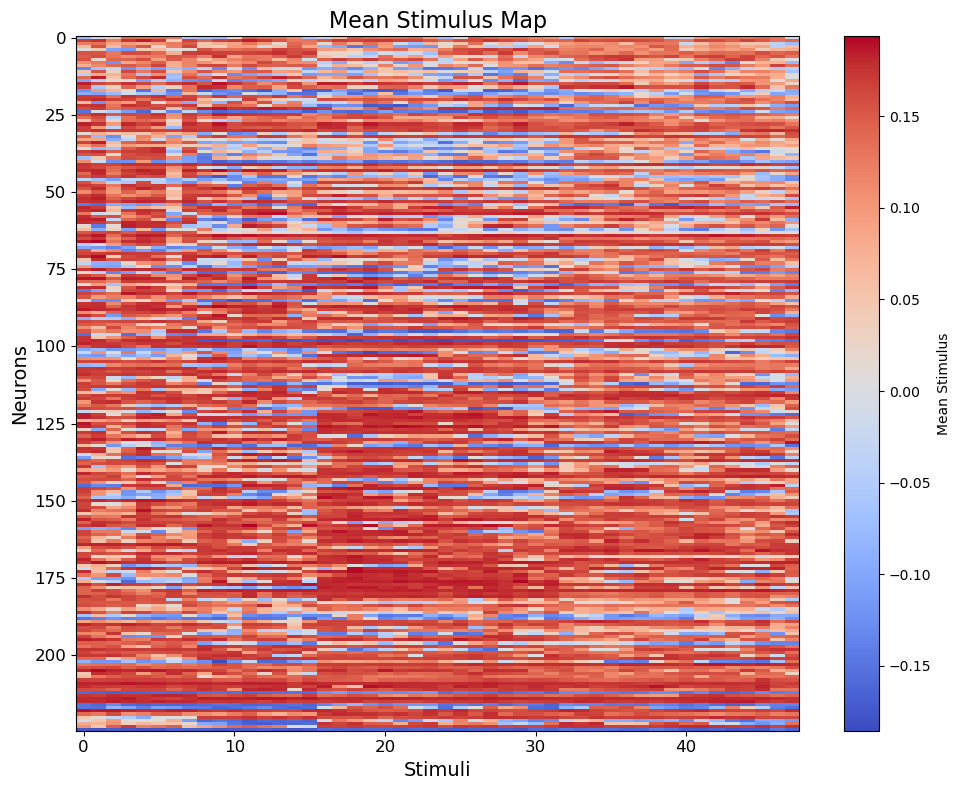

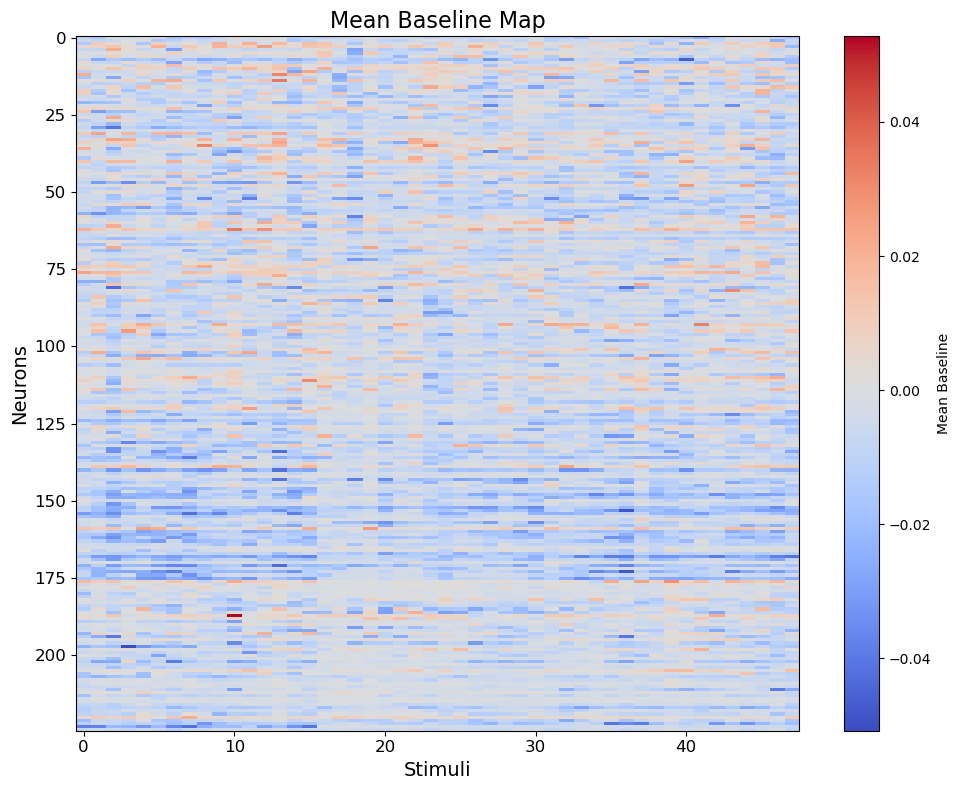

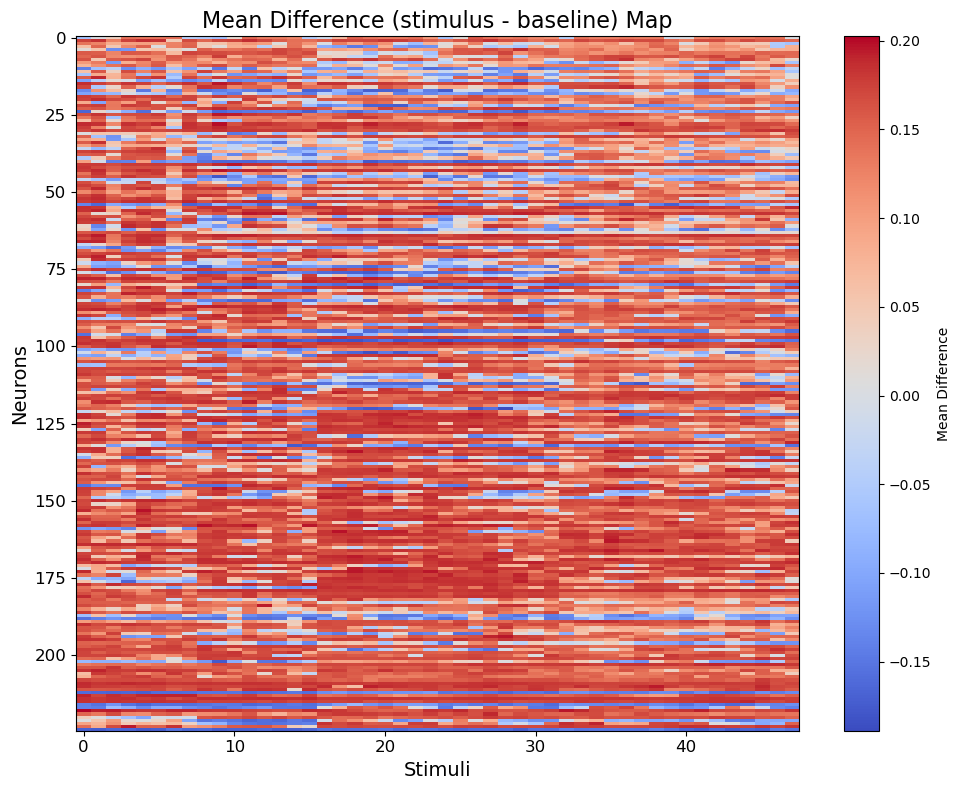

In [91]:
# Plot the mean_stimulus_matrix
plt.figure(figsize=(10, 8))
plt.imshow(mean_stimulus_matrix, cmap="coolwarm", aspect="auto", interpolation="nearest")
plt.colorbar(label="Mean Stimulus") 
plt.title("Mean Stimulus Map", fontsize=16)
plt.xlabel("Stimuli", fontsize=14)
plt.ylabel("Neurons", fontsize=14)

# Customize x and y ticks
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

# Show the plot
plt.tight_layout()
plt.show()

# Plot the mean_baseline_matrix
plt.figure(figsize=(10, 8))
plt.imshow(mean_baseline_matrix, cmap="coolwarm", aspect="auto", interpolation="nearest")
plt.colorbar(label="Mean Baseline") 
plt.title("Mean Baseline Map", fontsize=16)
plt.xlabel("Stimuli", fontsize=14)
plt.ylabel("Neurons", fontsize=14)

# Customize x and y ticks
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

# Show the plot
plt.tight_layout()
plt.show()

# Plot mean_stimulus_matrix - mean_baseline_matrix
plt.figure(figsize=(10, 8))
plt.imshow(mean_stimulus_matrix - mean_baseline_matrix, cmap="coolwarm", aspect="auto", interpolation="nearest")
plt.colorbar(label="Mean Difference") 
plt.title("Mean Difference (stimulus - baseline) Map", fontsize=16)
plt.xlabel("Stimuli", fontsize=14)
plt.ylabel("Neurons", fontsize=14)

# Customize x and y ticks
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

# Show the plot
plt.tight_layout()
plt.show()

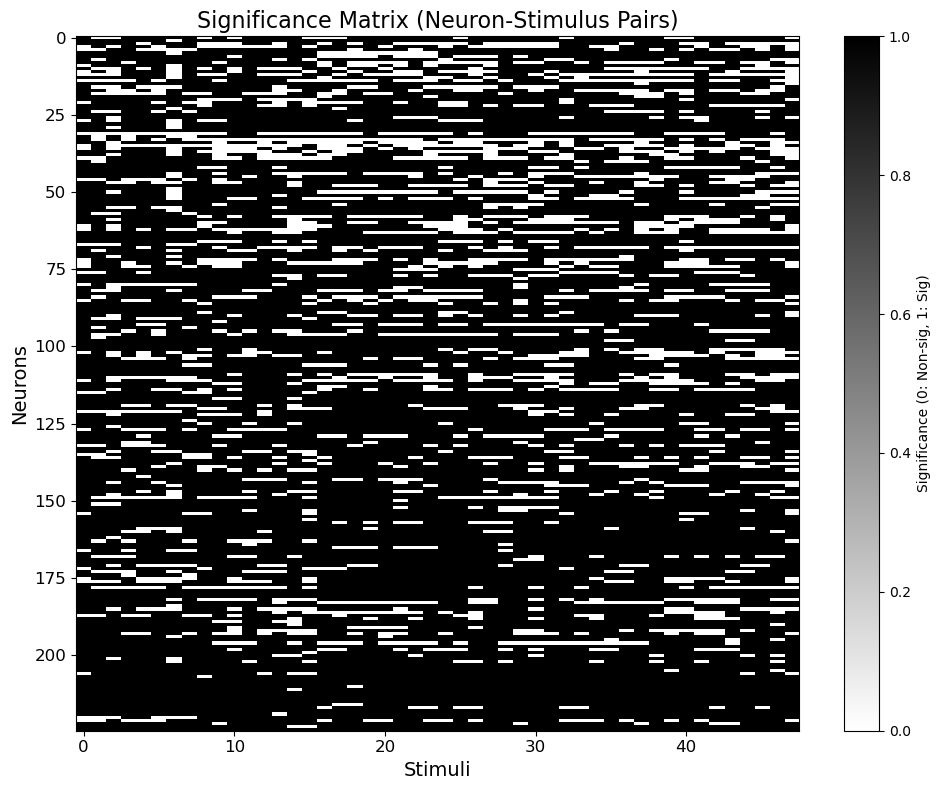

In [80]:
# Plot the heatmap
plt.figure(figsize=(10, 8))  # Set figure size
plt.imshow(significance_matrix, cmap="binary", aspect="auto", interpolation="nearest")
plt.colorbar(label="Significance (0: Non-sig, 1: Sig)")  # Add colorbar
plt.title("Significance Matrix (Neuron-Stimulus Pairs)", fontsize=16)
plt.xlabel("Stimuli", fontsize=14)
plt.ylabel("Neurons", fontsize=14)

# Customize x and y ticks
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

# Show the plot
plt.tight_layout()
plt.show()

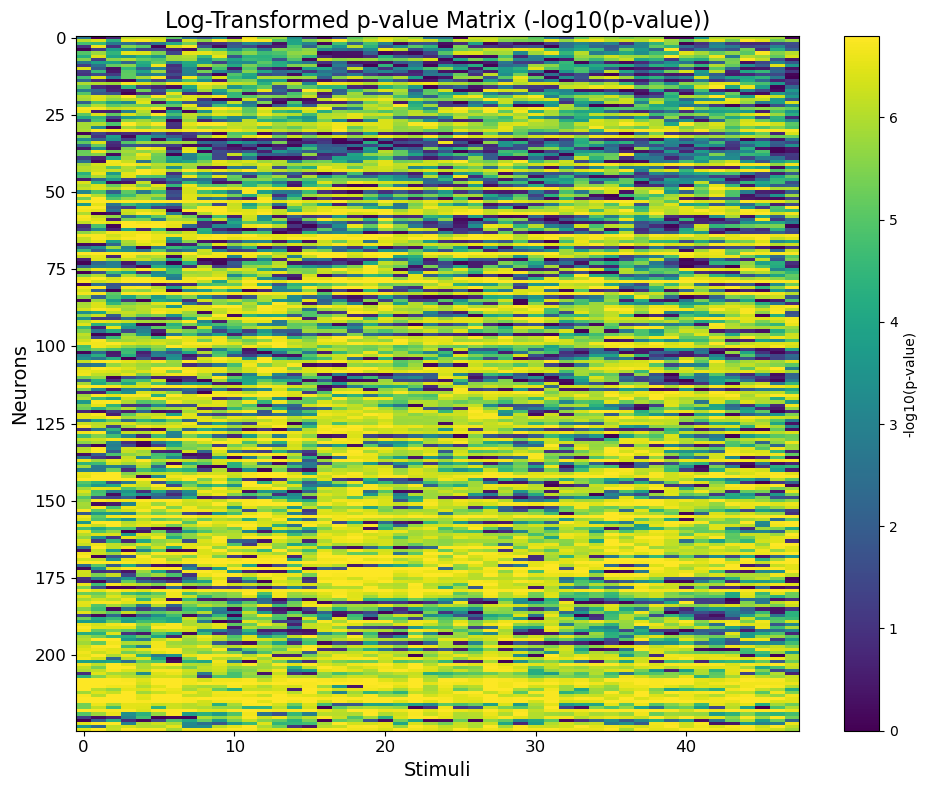

In [ ]:
# Plot the log-transformed p-value matrix
plt.figure(figsize=(10, 8))
plt.imshow(log_p_value_matrix, cmap="viridis", aspect="auto", interpolation="nearest")
plt.colorbar(label="-log10(p-value)")  
plt.title("Log-Transformed p-value Matrix (-log10(p-value))", fontsize=16)
plt.xlabel("Stimuli", fontsize=14)
plt.ylabel("Neurons", fontsize=14)

# Customize x and y ticks
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

# Show the plot
plt.tight_layout()
plt.show()

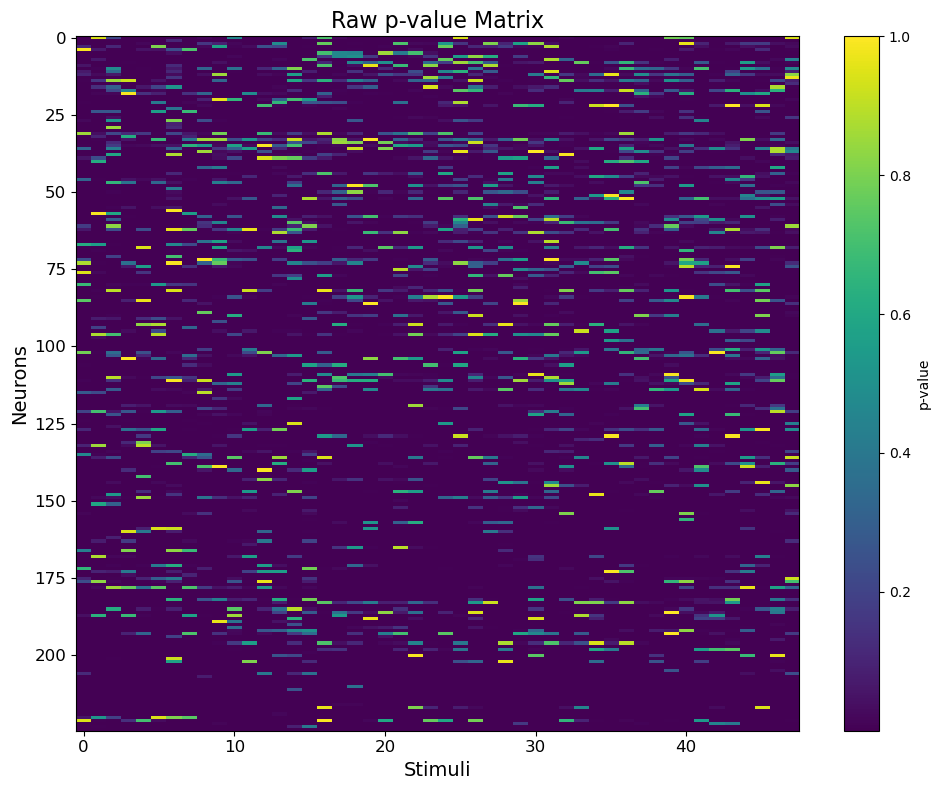

In [92]:
# Plot the raw p-value matrix
plt.figure(figsize=(10, 8))
plt.imshow(p_value_matrix, cmap="viridis", aspect="auto", interpolation="nearest")
plt.colorbar(label="p-value") 
plt.title("Raw p-value Matrix", fontsize=16)
plt.xlabel("Stimuli", fontsize=14)
plt.ylabel("Neurons", fontsize=14)

# Customize x and y ticks
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

# Show the plot
plt.tight_layout()
plt.show()

### Embedding

In [93]:
def reconstruct_tensor(factors):
    """Reconstructs the tensor from CP decomposition factors"""
    neurons, stimuli, time_len = factors[0].shape[0], factors[1].shape[0], factors[2].shape[0]
    rank = factors[0].shape[1]
    
    # Initialize reconstructed tensor
    reconstructed_tensor = np.zeros((neurons, stimuli, time_len))
    
    # Compute and sum the outer products of each rank-1 tensor
    for r in range(rank):
        component = np.outer(factors[0][:, r], factors[1][:, r])[:, :, np.newaxis] * factors[2][:, r]
        reconstructed_tensor += component
    
    return reconstructed_tensor

def run_cp_decomposition(data_tensor, rank, n_runs=15):
    """Runs CP decomposition multiple times for a given rank and returns best result and error"""
    for _ in range(n_runs):
        result = tt.cp_als(data_tensor, rank=rank, verbose=False) # CP decomposition using the ALS (Alternating Least Squares) algorithm
        # call reconstruct factors
        reconstruction = reconstruct_tensor(result.factors)
        # compute error
        error = np.linalg.norm(data_tensor - reconstruction) / np.linalg.norm(data_tensor)
        if _ == 0:
            best_error = error
            best_result = result
        else:
            if error < best_error:
                best_error = error
                best_result = result
        
    return best_result, best_error

In [94]:
optimal_rank = 15

# Compute CP Decomposition
optimal_factorization, error = run_cp_decomposition(X, rank=optimal_rank)
print(error)

0.566701843719592


In [95]:
optimal_factorization.factors[0].shape, optimal_factorization.factors[1].shape, optimal_factorization.factors[2].shape

((225, 15), (48, 15), (85, 15))

<class 'numpy.ndarray'>
(225, 15)


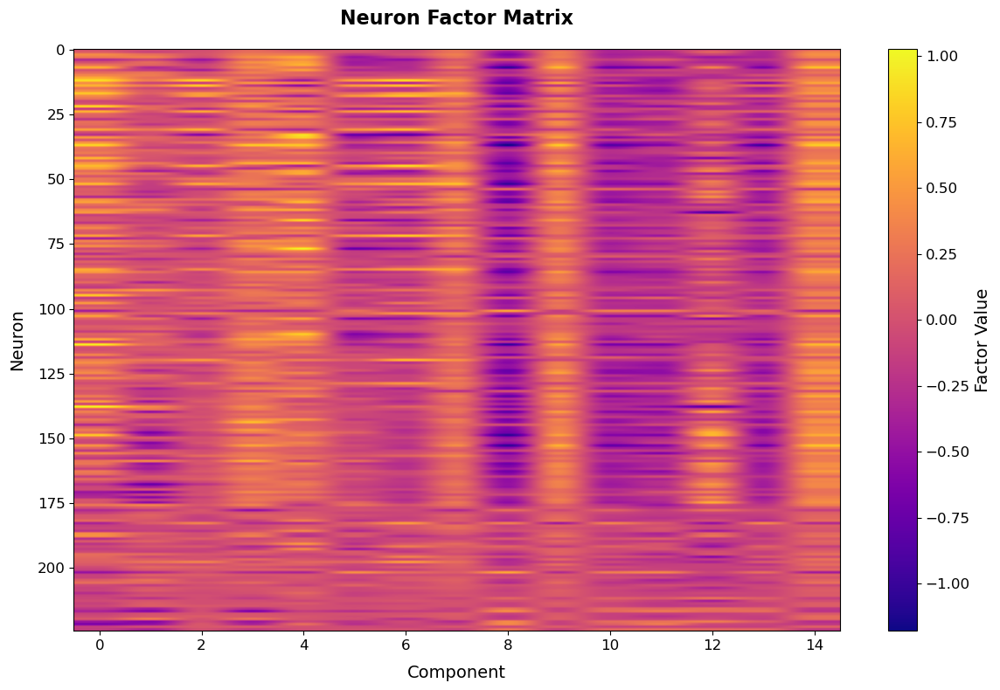

In [96]:
# constuct neurons by factors matrix from the optimal factorization
neurons_by_factors = np.zeros((N_NEURONS, optimal_rank))
neurons_by_factors = optimal_factorization.factors[0]
print(type(optimal_factorization.factors[0]))
print(optimal_factorization.factors[0].shape)

plt.figure(figsize=(12, 8))  
plt.imshow(neurons_by_factors, aspect='auto', cmap='plasma')

plt.title('Neuron Factor Matrix', fontsize=16, weight='bold', pad=20)
plt.xlabel('Component', fontsize=14, labelpad=10)
plt.ylabel('Neuron', fontsize=14, labelpad=10)

cbar = plt.colorbar(label='Factor Value')
cbar.ax.tick_params(labelsize=12)  
cbar.set_label('Factor Value', fontsize=14)

plt.xticks(fontsize=12)
plt.yticks(fontsize=12)

plt.tight_layout()  
plt.show()


In [97]:
from ian.ian import * 
from ian.embed_utils import *
from ian.dset_utils import *
from ian.utils import *

In [98]:
def remove_duplicates(data):
    """Removes duplicate rows from a numpy array"""
    return np.unique(data, axis=0)
### why duplicates? neurons with same facors in all components?

neurons_by_factors_unique = remove_duplicates(neurons_by_factors)
print(neurons_by_factors.shape)
print(neurons_by_factors_unique.shape)

(225, 15)
(225, 15)


<class 'numpy.ndarray'>
(225, 225)
### Iteration 1 done. (0.21 s) - pruned 1 edge(s)
### Iteration 2 done. (0.04 s) - pruned 1 edge(s)
### Iteration 3 done. (0.04 s) - pruned 1 edge(s)
### Iteration 4 done. (0.05 s) - pruned 1 edge(s)
### Iteration 5 done. (0.06 s) - pruned 1 edge(s)
### Iteration 6 done. (0.06 s) - pruned 1 edge(s)
### Iteration 7 done. (0.06 s) - pruned 1 edge(s)
### Iteration 8 done. (0.04 s) - pruned 1 edge(s)
### Iteration 9 done. (0.05 s) - pruned 1 edge(s)
### Iteration 10 done. (0.05 s) - pruned 1 edge(s)
### Iteration 11 done. (0.05 s) - pruned 1 edge(s)
### Iteration 12 done. (0.05 s) - pruned 1 edge(s)
### Iteration 13 done. (0.06 s) - pruned 1 edge(s)
### Iteration 14 done. (0.06 s) - pruned 1 edge(s)
### Iteration 15 done. (0.06 s) - pruned 1 edge(s)
### Iteration 16 done. (0.05 s) - pruned 1 edge(s)
### Iteration 17 done. (0.05 s) - pruned 1 edge(s)
### Iteration 18 done. (0.05 s) - pruned 1 edge(s)
### Iteration 19 done. (0.04 s) - pruned 1 edge(s)
### I

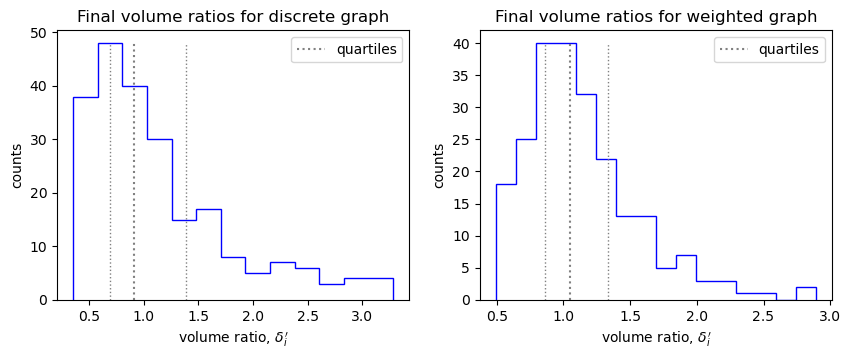

In [99]:
D2 = pwdists(neurons_by_factors_unique, sqdists=True)
print(type(D2))
print(D2.shape)

G, wG, optScales, disc_pts = IAN('exact-precomputed-sq', D2)

<class 'numpy.ndarray'>
(225, 3)


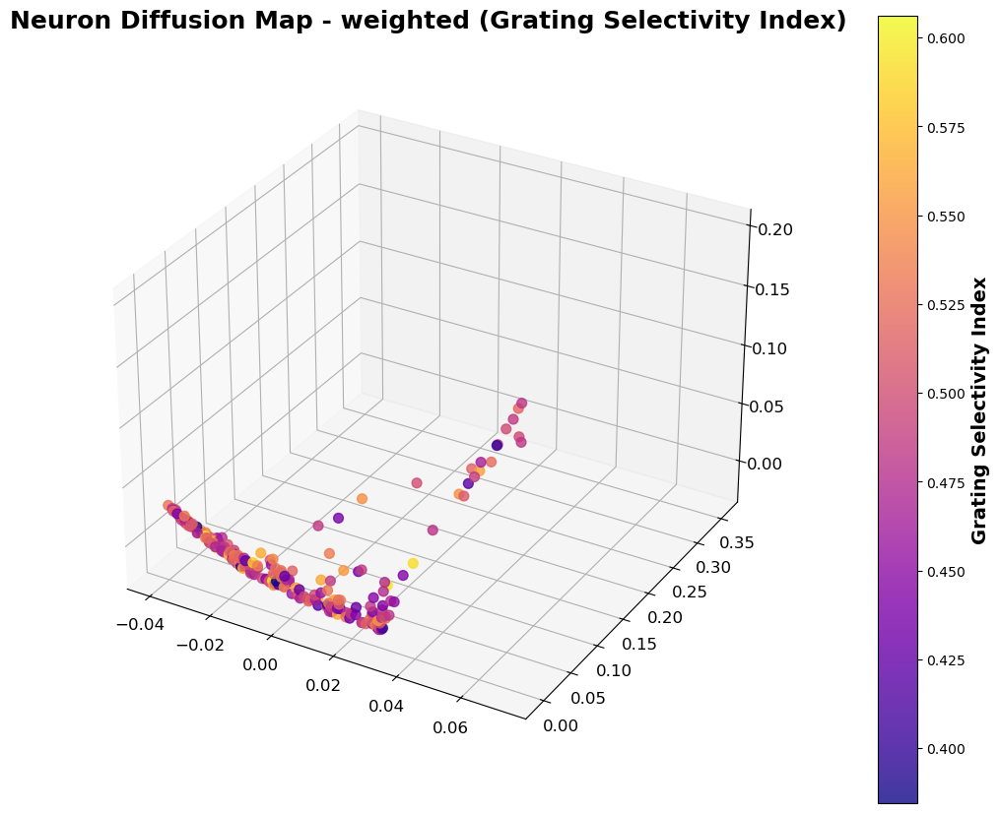

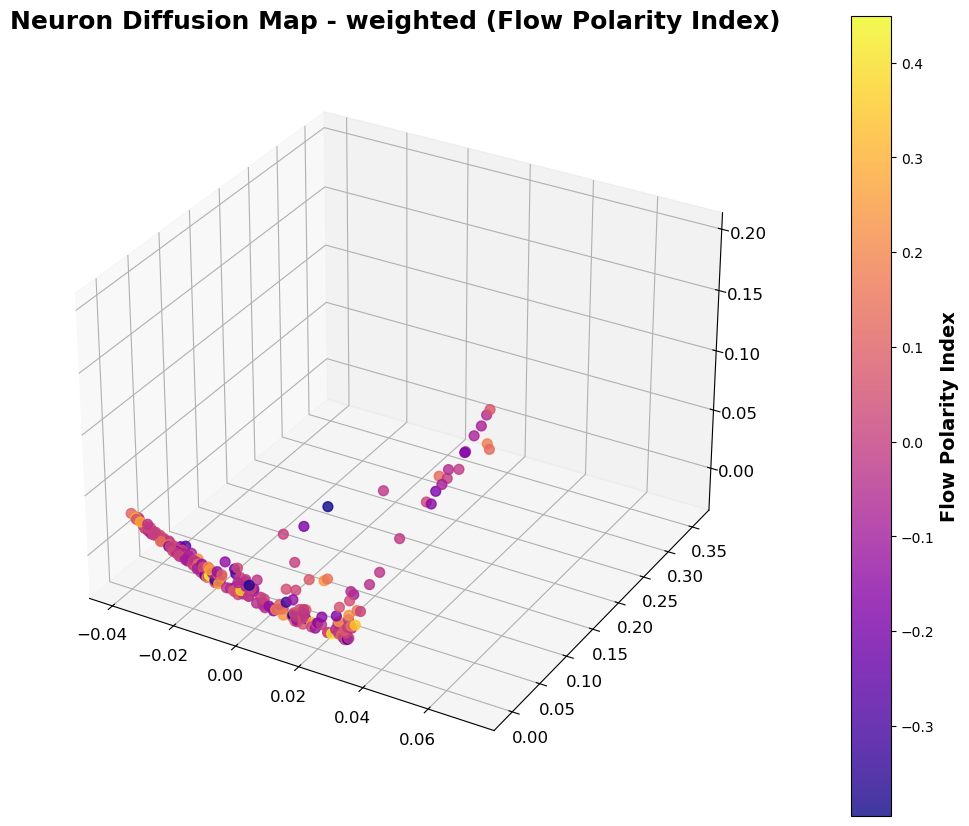

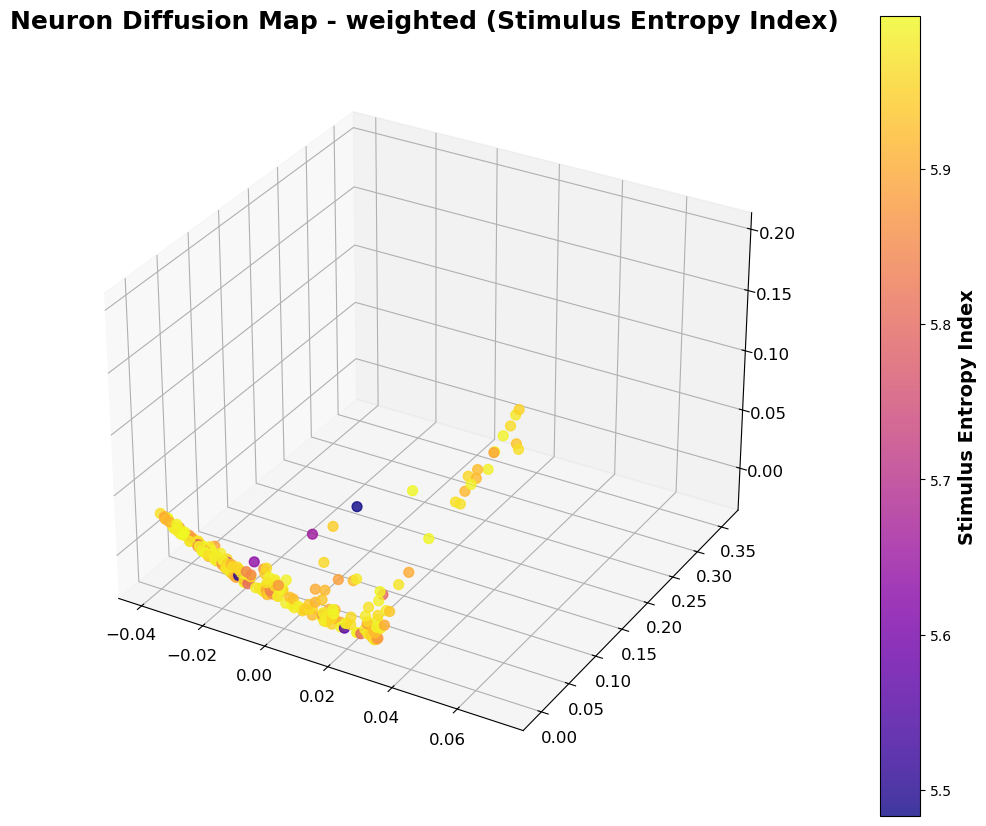

In [120]:
diffusion = SpectralEmbedding(n_components=3, affinity='precomputed')
embedding = diffusion.fit_transform(wG)
print(type(embedding))
print(embedding.shape)

# Function to create scatter plots with different indices
def plot_embedding_with_index(embedding, index, index_name, cmap='plasma'):
    fig = plt.figure(figsize=(12, 10))
    ax = fig.add_subplot(111, projection='3d')

    # Scatter plot with colormap based on the selected index
    sc = ax.scatter(
        embedding[:, 0], embedding[:, 1], embedding[:, 2],
        c=index, cmap=cmap, s=50, alpha=0.8
    )

    # Add colorbar and label it
    cbar = plt.colorbar(sc, ax=ax, pad=0.1)
    cbar.set_label(f'{index_name}', fontsize=14, weight='bold')

    # Set title and adjust font size and weight
    ax.set_title(f'Neuron Diffusion Map - weighted ({index_name})', fontsize=18, fontweight='bold', pad=20)

    # Adjust tick label font sizes
    ax.tick_params(axis='x', labelsize=12)
    ax.tick_params(axis='y', labelsize=12)
    ax.tick_params(axis='z', labelsize=12)

    # Fix layout to ensure everything is visible
    plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.1)

    # Show the plot
    plt.show()

# Plot with grating_selectivity_index
plot_embedding_with_index(embedding, grating_selectivity_index, 'Grating Selectivity Index')

# Plot with flow_polarity_index
plot_embedding_with_index(embedding, flow_polarity_index, 'Flow Polarity Index')

# Plot with stimulus_entropy_index
plot_embedding_with_index(embedding, stimulus_entropy_index, 'Stimulus Entropy Index')

<class 'numpy.ndarray'>
(225, 3)


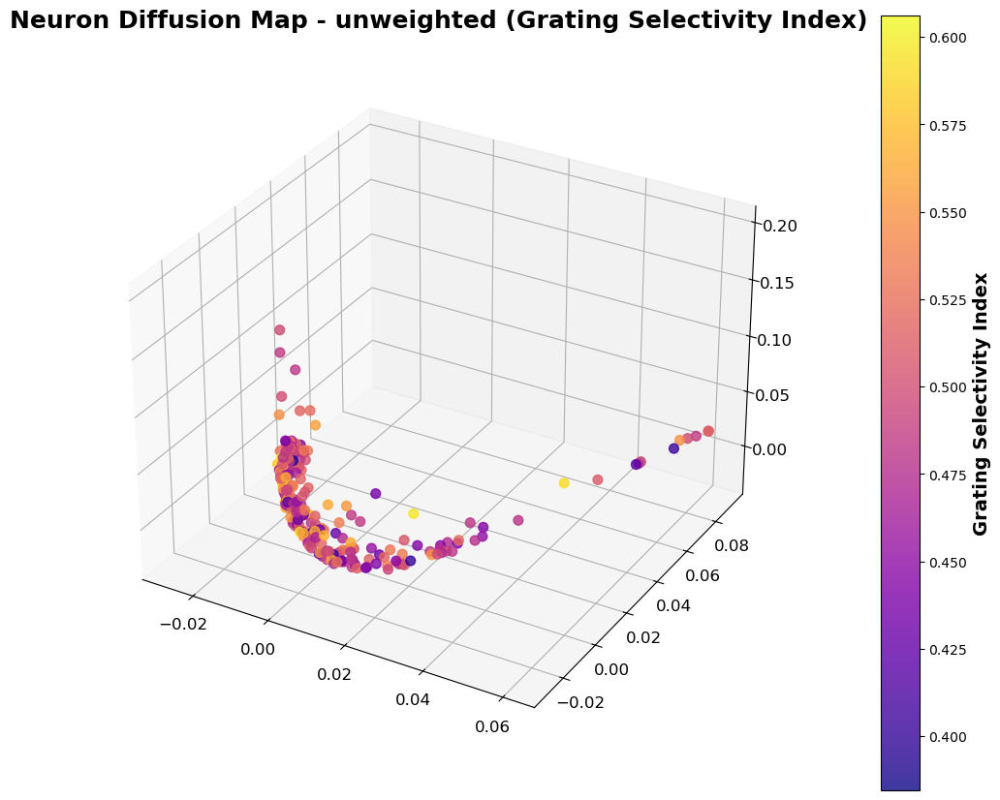

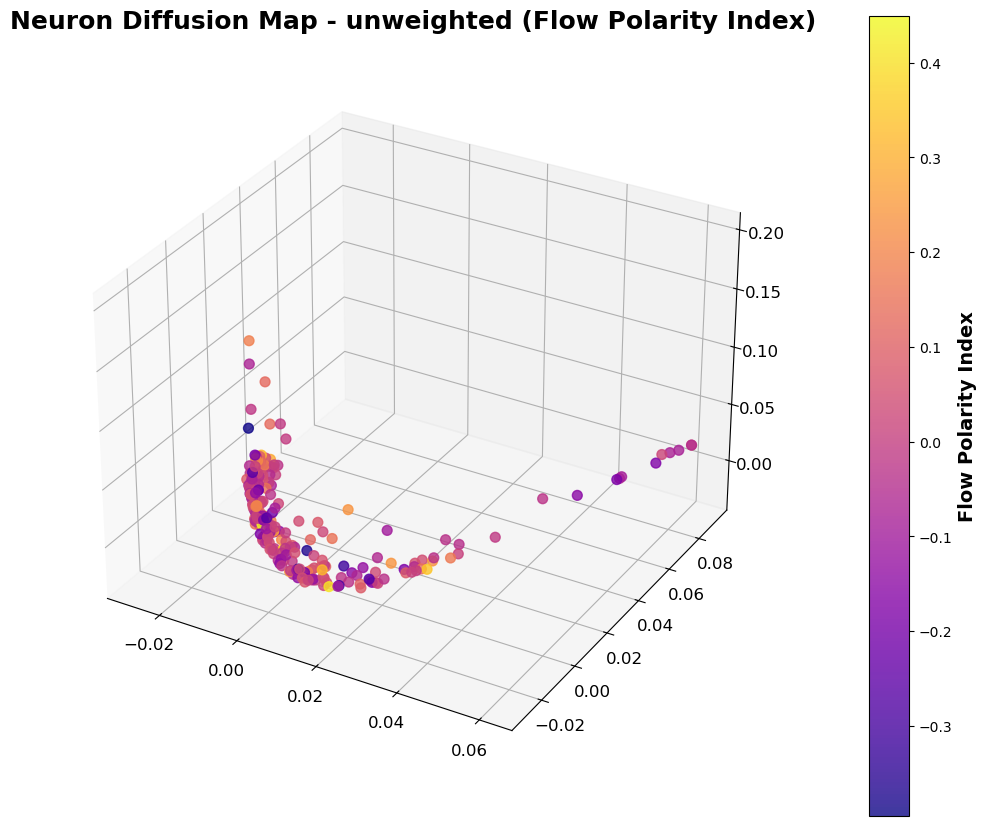

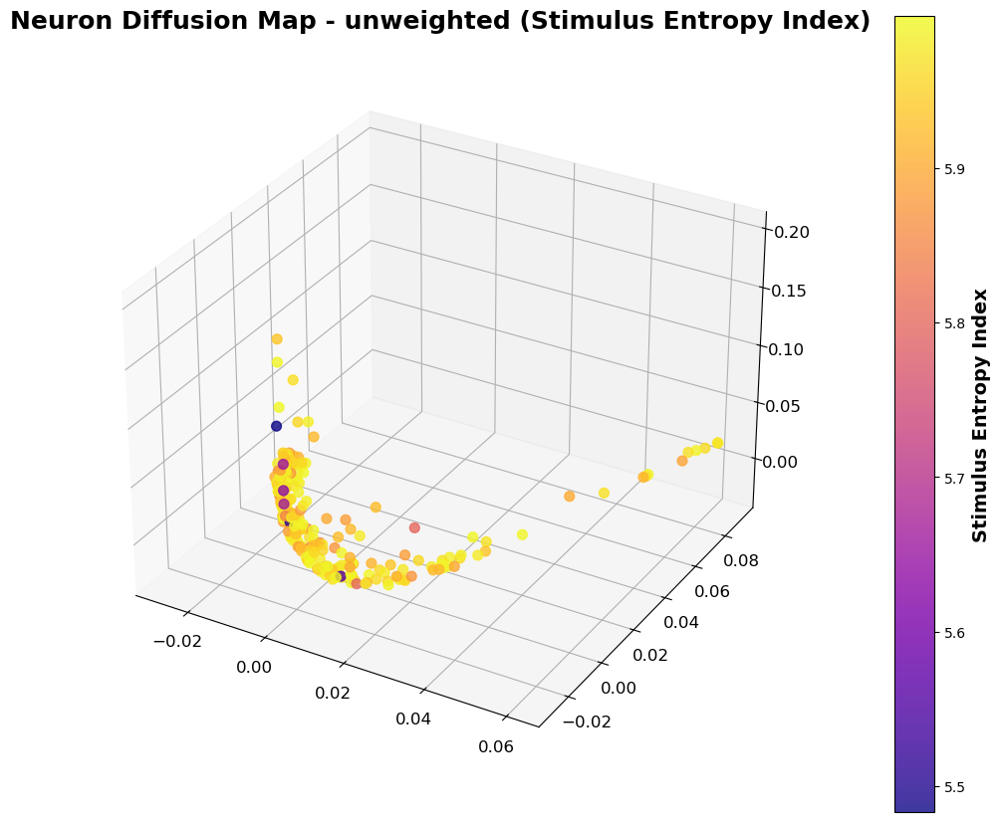

In [121]:
diffusion = SpectralEmbedding(n_components=3, affinity='precomputed')
embedding = diffusion.fit_transform(G)
print(type(embedding))
print(embedding.shape)

# Function to create scatter plots with different indices
def plot_embedding_with_index(embedding, index, index_name, cmap='plasma'):
    fig = plt.figure(figsize=(12, 10))
    ax = fig.add_subplot(111, projection='3d')

    # Scatter plot with colormap based on the selected index
    sc = ax.scatter(
        embedding[:, 0], embedding[:, 1], embedding[:, 2],
        c=index, cmap=cmap, s=50, alpha=0.8
    )

    # Add colorbar and label it
    cbar = plt.colorbar(sc, ax=ax, pad=0.1)
    cbar.set_label(f'{index_name}', fontsize=14, weight='bold')

    # Set title and adjust font size and weight
    ax.set_title(f'Neuron Diffusion Map - unweighted ({index_name})', fontsize=18, fontweight='bold', pad=20)

    # Adjust tick label font sizes
    ax.tick_params(axis='x', labelsize=12)
    ax.tick_params(axis='y', labelsize=12)
    ax.tick_params(axis='z', labelsize=12)

    # Fix layout to ensure everything is visible
    plt.subplots_adjust(left=0.1, right=0.9, top=0.9, bottom=0.1)

    # Show the plot
    plt.show()

# Plot with grating_selectivity_index
plot_embedding_with_index(embedding, grating_selectivity_index, 'Grating Selectivity Index')

# Plot with flow_polarity_index
plot_embedding_with_index(embedding, flow_polarity_index, 'Flow Polarity Index')

# Plot with stimulus_entropy_index
plot_embedding_with_index(embedding, stimulus_entropy_index, 'Stimulus Entropy Index')

# End